# Problem Statement:
Clustering the Countries by using Unsupervised Learning for HELP International
# Objective:
To categorise the countries using socio-economic and health factors that determine the overall development of the country.

# About organization:
HELP International is an international humanitarian NGO that is committed to fighting poverty and providing the people of backward countries with basic amenities and relief during the time of disasters and natural calamities.

# Problem Statement:
HELP International have been able to raise around $ 10 million. Now the CEO of the NGO needs to decide how to use this money strategically and effectively. So, CEO has to make decision to choose the countries that are in the direst need of aid. Hence, your Job as a Data scientist is to categorise the countries using some socio-economic and health factors that determine the overall development of the country. Then you need to suggest the countries which the CEO needs to focus on the most.

HELP International plans to donate some money to countries in need.We have to categorize the countries using the given information and introduce the needy countries.

# About the columns:
* country: Name of the country.
* child_mort: Death of children under 5 years of age per 1000 live births.
* exports: Exports of goods and services per capita. Given as %age of the GDP per capita.
* health: Total health spending per capita. Given as %age of GDP per capita.
* imports: Imports of goods and services per capita. Given as %age of the GDP per capita.
* Income: Net income per person
* Inflation: The measurement of the annual growth rate of the Total GDP.
* life_expec: The average number of years a new born child would live if the current mortality patterns are to rem...
* total_fer: The number of children that would be born to each woman if the current age-fertility rates remain th...
* gdpp: The GDP per capita. Calculated as the Total GDP divided by the total population.

In [1]:
# import the important libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import warnings
warnings.filterwarnings('ignore')

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['font.sans-serif'] = "Comic Sans MS"


importing several Python libraries requires for country dataset
. Here's what each of these libraries does:

* $pandas profiling:$ This library provides functionality for generating profile reports from pandas DataFrame objects. These reports include statistics, data types, missing values, and more, making it useful for data exploration and analysis.

* $plotly express:$Plotly Express is a high-level interface for creating interactive visualizations using Plotly, a popular plotting library. It simplifies the process of creating complex visualizations with minimal code.

* $pycountry convert:$ This library allows you to convert between different country-related information, such as converting between country codes, names, and regions. It's helpful when working with country-related data.

* $geopy geocoders Nominatim:$ Geopy is a library for geocoding (finding the geographical coordinates of a location) and reverse geocoding (finding a location's address based on its coordinates). Nominatim is one of the geocoding services provided by Geopy.

* $mpl_toolkits basemap Basemap:$ Basemap is a toolkit for plotting maps and geographical data using Matplotlib. It provides functions for creating maps and plotting data on them.

* Each of these libraries serves a specific purpose, and you can use them to perform various data analysis, visualization, and geospatial tasks in your Python projects.

$kneed$ is a Python library used for finding the "knee" or "elbow" point in a dataset. In the context of data analysis and machine learning, the knee point often represents an optimal number of clusters or groups.

Here's what kneed can be used for:

Determining Optimal K in K-Means Clustering: In unsupervised machine learning, K-Means clustering is used to group data points into K clusters. The optimal value of K is not always known in advance. kneed helps you find the point in the clustering error (inertia) plot where the rate of change slows down significantly, indicating the appropriate number of clusters.

Choosing the Right Number of Clusters: Beyond K-Means, kneed can be used to find the optimal number of clusters in other clustering algorithms as well, such as hierarchical clustering, DBSCAN, or Gaussian Mixture Models (GMM).

Evaluating Dimensionality Reduction: If you are performing dimensionality reduction techniques like Principal Component Analysis (PCA) or t-Distributed Stochastic Neighbor Embedding (t-SNE), kneed can help you determine the optimal number of components or dimensions to retain.

To use kneed, you typically follow these steps:

Compute a metric (usually a cost or error metric) for a range of values (e.g., cluster numbers, dimensions).

Plot the metric values against the range of values.

Use kneed to automatically identify the point where the metric curve exhibits an "elbow" or "knee" shape, which often indicates the optimal value.

The library provides a convenient way to automate the process of finding this point, helping data analysts and machine learning practitioners make informed decisions about parameters like the number of clusters or dimensions to use in their models.










In [2]:
!pip3 install pandas_profiling
!pip install plotly
!pip install pycountry_convert
!pip install basemap_data
!pip install basemap
!pip install geopy
!pip install kneed




Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: beakerx-base 2.0.1 has a non-standard dependency specifier ipywidgets<8pandas,>=7.5.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of beakerx-base or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: beakerx-base 2.0.1 has a non-standard dependency specifier ipywidgets<8pandas,>=7.5.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of beakerx-base or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
Defaulting to user installation because normal site-packages is not wr

In [3]:
!pip install cartopy

Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: beakerx-base 2.0.1 has a non-standard dependency specifier ipywidgets<8pandas,>=7.5.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of beakerx-base or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


$Note$: cartopy.crs is a module that provides various map projections and coordinate reference systems (CRS) for geospatial data visualization.

In [4]:
import pandas_profiling
import plotly.express as px
import pycountry_convert as pc
from geopy.geocoders import Nominatim
import cartopy.crs as ccrs

In [5]:
# lets start by importing the Country_data.csv and read its insights
country_data =pd.read_csv('Country-data.csv')
country_data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [6]:
country_data.shape

(167, 10)

In [7]:
country_data.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

In [8]:
country_data.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


# Interpretation:
* from the above dataset we have noticed that inflation column has a range from -4.2% to 104% which can impact our gdp
* life expectancy ranges from 32 to 82 age group and income rate between  609$ to 12500$.

In [9]:
country_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [10]:
#check for null values
country_data.isnull().sum()

country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

we can see that thereare no null values hence we can proceed with data preprocessing

#  Data    Preprocessing:

$NOTE$:  the Yellowbrick library, specifically for Principal Component Analysis (PCA) visualization. Yellowbrick is a Python library that provides visualizations for machine learning tasks.
* This can be helpful for understanding the variance explained by different principal components and identifying patterns in your data when reducing its dimensionality.

In [11]:
# import import libraries for data preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA #principal Component Analysis
!pip install yellowbrick # it help to visualize PCA decomposition data named as a PCAVisualizer
from yellowbrick.features import PCA as PCAVisualizer


Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: beakerx-base 2.0.1 has a non-standard dependency specifier ipywidgets<8pandas,>=7.5.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of beakerx-base or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


$Note$: lets see an overivew of the profile includes  overview, variables,interactions, correlations,missingvalues and sample of data

In [12]:
# let overview the report of the entire dataset before going a head for testing our data
country_data.profile_report()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# lets compare the above data profiling report is correct or not for nan values, duplicates,uniques
null =country_data.isnull().sum().to_frame(name= 'Null').T # T is to transpose the data row wise 
na =country_data.isna().sum().to_frame(name= 'IS NA').T
unique =country_data.nunique().to_frame(name='Unique').T
info= pd.concat([null,na,unique]) # summarize all the column by using pd.concat
info

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
Null,0,0,0,0,0,0,0,0,0,0
IS NA,0,0,0,0,0,0,0,0,0,0
Unique,167,139,147,147,151,156,156,127,138,157


In [14]:
country_data.duplicated().sum()

0

$Interpretation$: hence we can see the profile_report has done greatly in our dataset preprocessing.

# visualize the data for correlation and scater plot
* we use of heatmap for country data and correlation by dropping country column
* annot here is true: This parameter adds annotations (the actual correlation values) to the cells of the heatmap.
* Here we also want to show the upper triangular only hence we used np.triu function as correlation are symmetric.
* np.ones_like  is used to generate an array of ones with the same shape as the correlation matrix. 

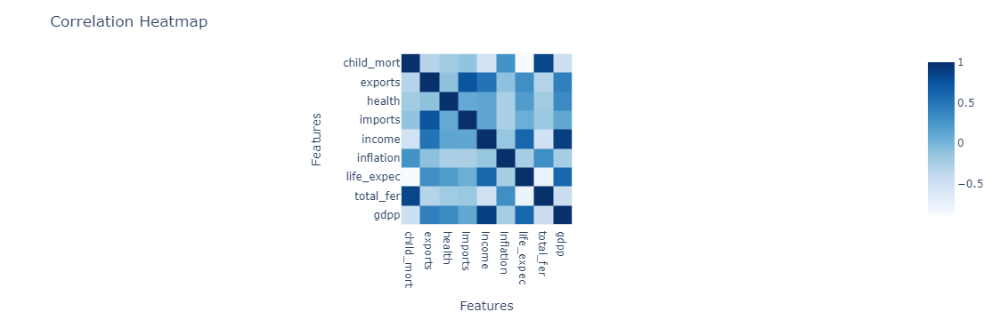

In [15]:
#plt.figure(figsize = (10, 5))
#sns.heatmap(country_data.drop(columns=['country'], axis=1).corr(), annot=True, cmap='Blues', mask=np.triu(np.ones_like(country_data.drop(columns=['country'], axis=1).corr())))
#plt.show()


# Calculate the correlation matrix
correlation_matrix = country_data.corr()

# Create a heatmap using Plotly Express
fig = px.imshow(correlation_matrix,
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                 color_continuous_scale='Blues')

# Add annotations to the heatmap
fig.update_traces(text=correlation_matrix.values.round(2), showscale=False)

# Customize the layout
fig.update_layout(title='Correlation Heatmap',
                  xaxis_title='Features',
                  yaxis_title='Features')

# Show the plot
fig.show()

In [167]:
print(matplotlib.matplotlib_fname())

/usr/local/lib/python3.10/site-packages/matplotlib/mpl-data/matplotlibrc


$Interperation$:  From the above heat map we observed that:
* 1.gdpp is highly correlated(linear relationship) to income. (0.9)
* 2.total_fer is highly correlated (linear relationship) to child_mort(0.85)
* 3.imports is highly correlated(linear relationship) to export (0.74)
* 4.life expec is highly ngative correlated (linear relationship)to child_morth(-0.89)

# lets visuaize the scatter plot for each for more depth look out. 


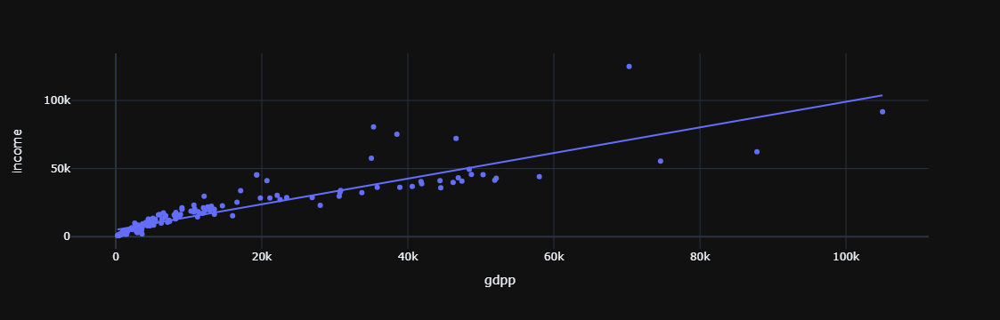

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


In [18]:
# lets plot between gdpp and income 
# here we will be using plotly express for depth of visualization in the graph
fig =px.scatter(country_data,x='gdpp',y='income',trendline='ols')
fig.update_layout(template="plotly_dark")
fig.show()
results =px.get_trendline_results(fig)
print(results)


In [19]:

results.px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     668.5
Date:                Mon, 18 Sep 2023   Prob (F-statistic):           6.40e-60
Time:                        13:10:21   Log-Likelihood:                -1749.0
No. Observations:                 167   AIC:                             3502.
Df Residuals:                     165   BIC:                             3508.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4932.9867    816.246      6.044      0.000    3321.354    6544.620
x1             0.9420      0.036     25.856      0.000       0.870       1.014
==============================================================================
Omnibus:                      128.385   Durbin-Watson:                   1.671
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1490.915
Skew:                           2.735   Prob(JB):                         0.00
Kurtosis:                      16.577   Cond. No.                     2.75e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.75e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

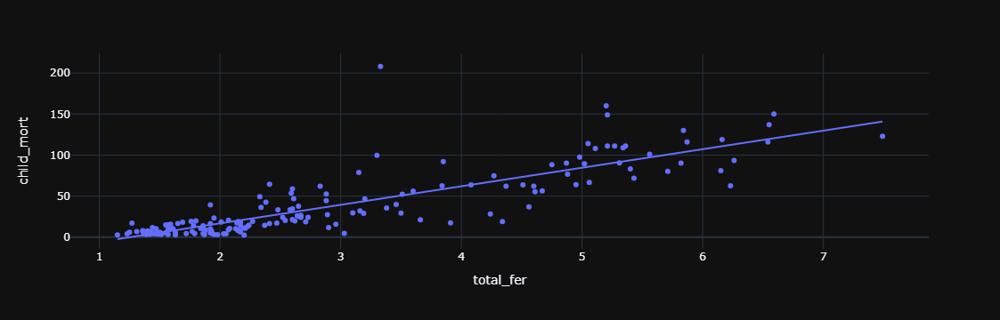

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.720
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     424.1
Date:                Mon, 18 Sep 2023   Prob (F-statistic):           1.84e-47
Time:                        13:10:21   Log-Likelihood:                -747.60
No. Observations:                 167   AIC:                             1499.
Df Residuals:                     165   BIC:                             1505.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -28.3642      3.635     -7.803      0.000     -35.541     -21.187
x1            22.6035      1.098     20.594      0.000      20.436      24.771
==============================================================================
Omnibus:                      139.451   Durbin-Watson:                   1.583
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2763.197
Skew:                           2.824   Prob(JB):                         0.00
Kurtosis:                      22.110   Cond. No.                         7.80
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [20]:
# lets plot between total_fer and child_mort
# here we will be using plotly express for depth of visualization in the graph
fig =px.scatter(country_data,x='total_fer',y='child_mort',trendline='ols')
fig.update_layout(template="plotly_dark")
fig.show()
results =px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()

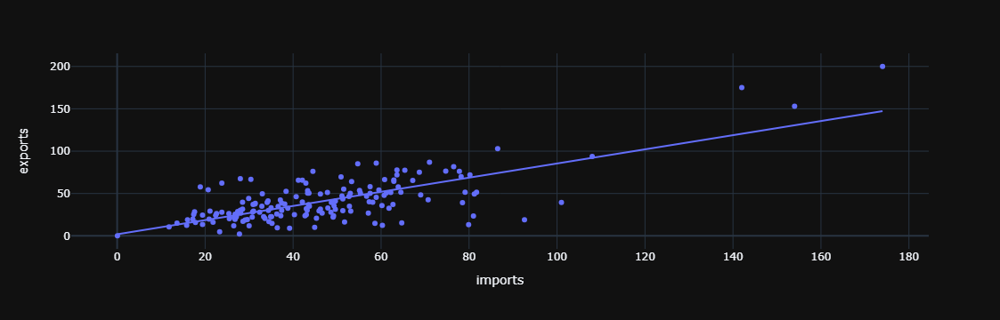

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     196.6
Date:                Mon, 18 Sep 2023   Prob (F-statistic):           6.43e-30
Time:                        13:10:21   Log-Likelihood:                -723.88
No. Observations:                 167   AIC:                             1452.
Df Residuals:                     165   BIC:                             1458.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9594      3.140      0.624      0.534      -4.241       8.159
x1             0.8349      0.060     14.022      0.000       0.717       0.952
==============================================================================
Omnibus:                        6.823   Durbin-Watson:                   1.771
Prob(Omnibus):                  0.033   Jarque-Bera (JB):               11.706
Skew:                          -0.025   Prob(JB):                      0.00287
Kurtosis:                       4.296   Cond. No.                         115.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [21]:
# lets plot between imports and exports

# here we will be using plotly express for depth of visualization in the graph
fig =px.scatter(country_data,x='imports',y='exports',trendline='ols')
fig.update_layout(template="plotly_dark")
fig.show()
results =px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()

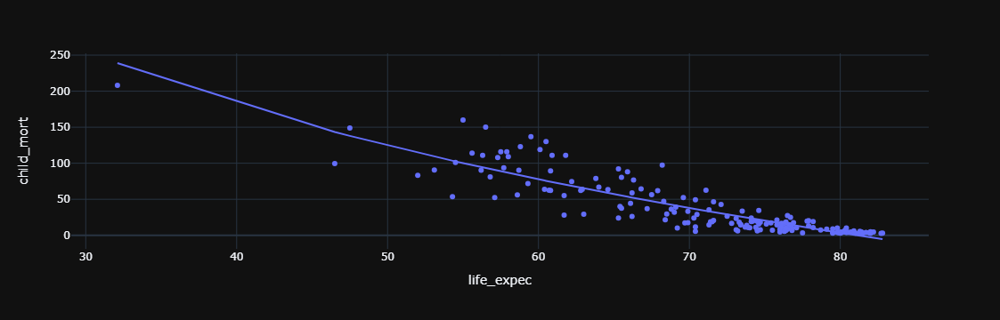

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     606.6
Date:                Mon, 18 Sep 2023   Prob (F-statistic):           3.78e-57
Time:                        13:10:22   Log-Likelihood:                -725.07
No. Observations:                 167   AIC:                             1454.
Df Residuals:                     165   BIC:                             1460.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1132.9062     44.469     25.477      0.000    1045.105    1220.707
x1          -593.4083     24.094    -24.629      0.000    -640.981    -545.836
==============================================================================
Omnibus:                       19.469   Durbin-Watson:                   1.792
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.992
Skew:                           0.636   Prob(JB):                     3.07e-07
Kurtosis:                       4.641   Cond. No.                         73.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [22]:
# lets plot between 4.life_expec and child_mort
# here we will be using plotly express for depth of visualization in the graph
fig =px.scatter(country_data,x='life_expec',y='child_mort',trendline='ols',trendline_options=dict(log_x=True))
fig.update_layout(template="plotly_dark")
fig.show()
results =px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()

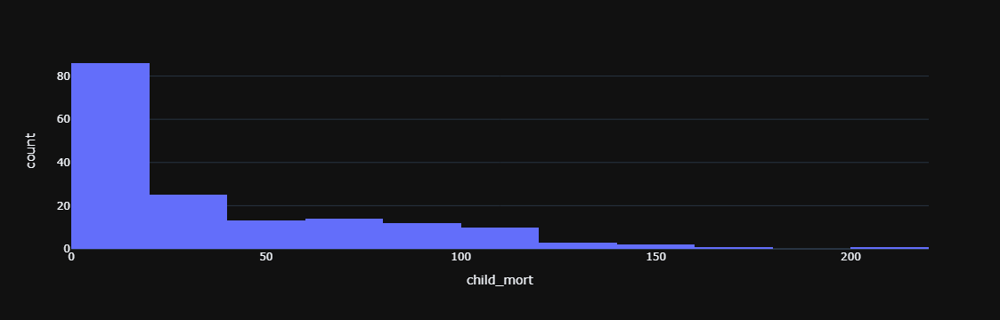

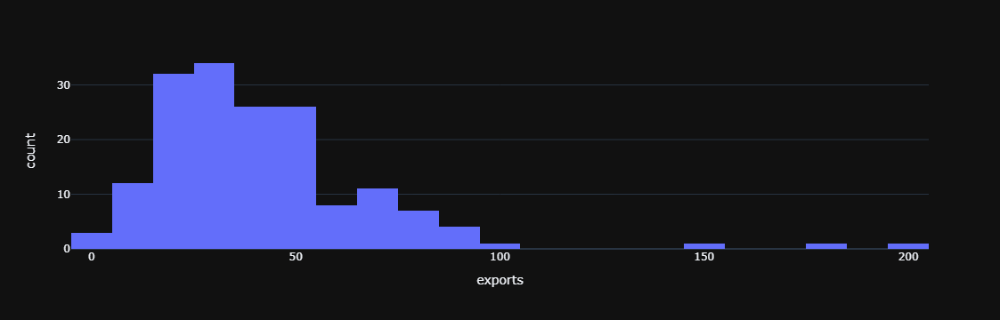

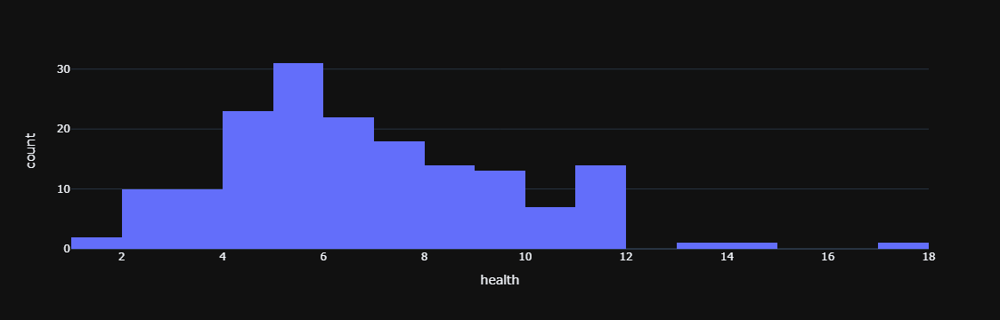

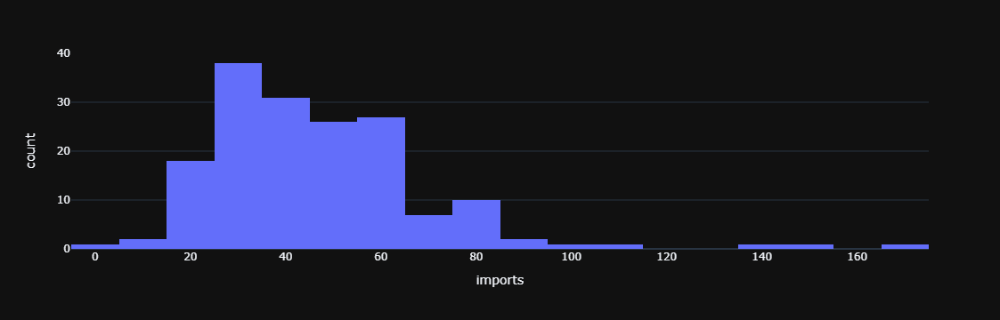

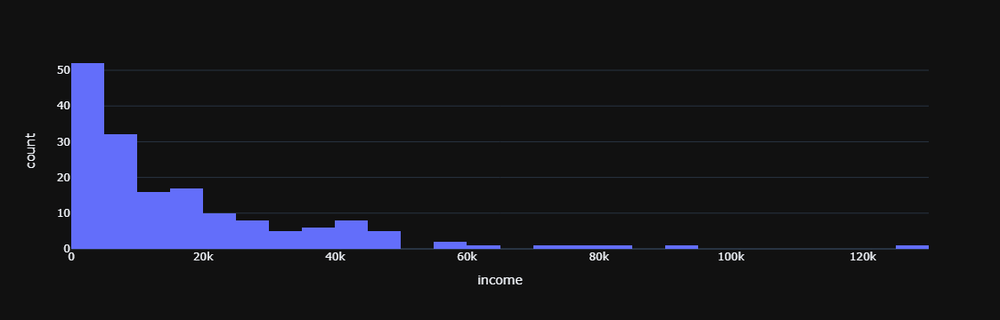

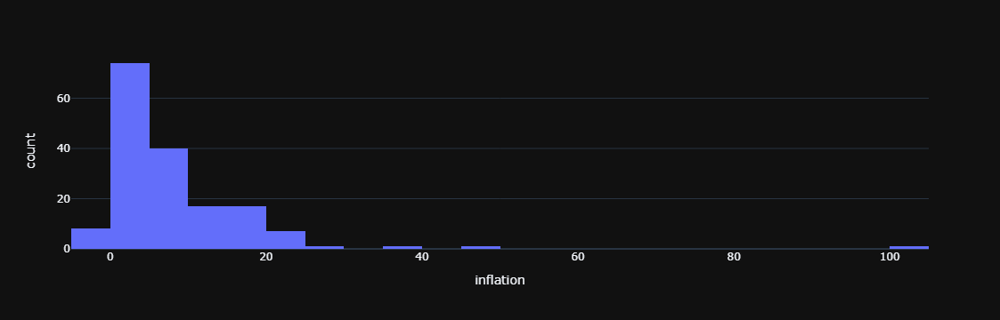

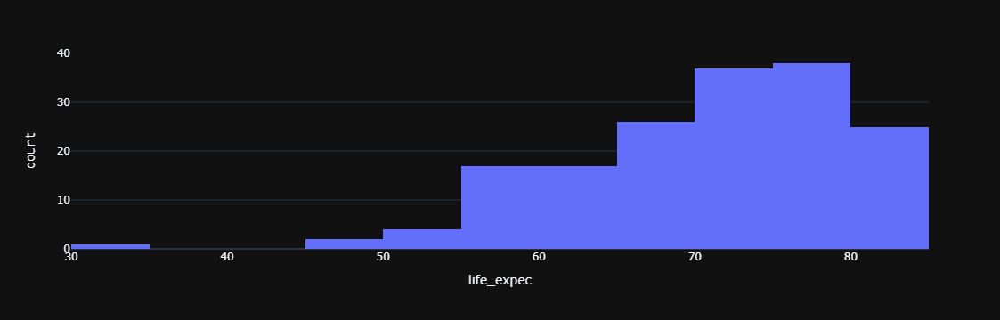

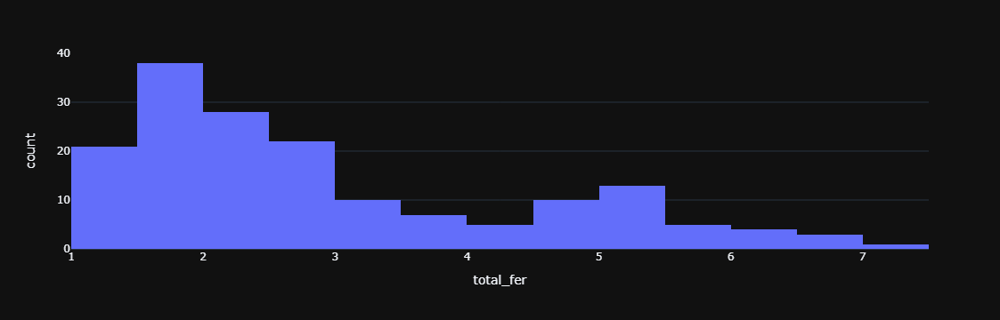

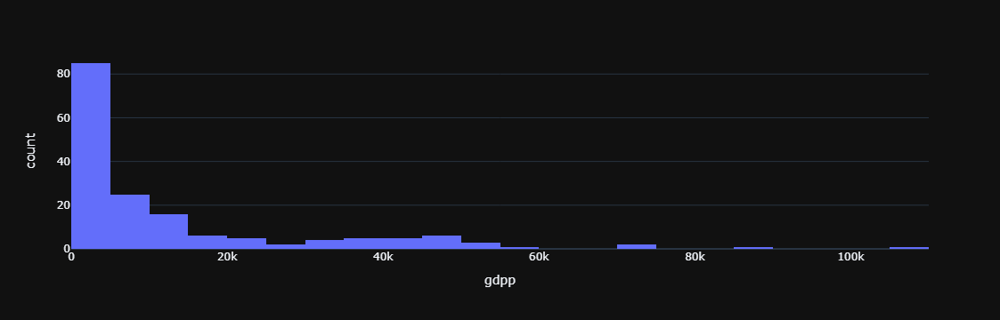

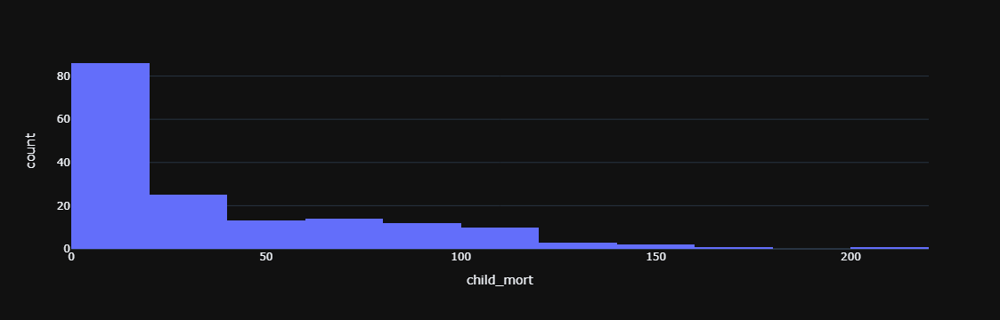

In [23]:
# lets check individual cloumn data:
num_cols = [ 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp','child_mort']

for i in range(0, len(num_cols), 2):
    fig= px.histogram(country_data,x=country_data[num_cols[i]])
    fig.update_layout(template='plotly_dark')
    fig.show()
    plt.subplot(121)
    fig= px.histogram(country_data,x=country_data[num_cols[i+1]])
    fig.update_layout(template='plotly_dark')
    fig.show()
    

# lets check the top ten and worst ten countries in each features('child_mort', 'exports', 'health', 'imports', 'income','inflation', 'life_expec', 'total_fer', 'gdpp')

In [24]:
# First, we define two functions.

# This chart shows the top ten countries in each feature.

def pie_chart_highest(country_data,name_feature):
    df1 = country_data.sort_values(by=name_feature,ascending=False)
    fig=px.pie(df1[:10],values=name_feature,names="country",title="Top 10 Countries With The Highest " + name_feature,color_discrete_sequence=px.colors.sequential.Purples_r)
    fig.show()

# This chart shows the ten worst countries in each feature.
def pie_chart_lowest(country_data,name_feature):
    df2=country_data.sort_values(by= name_feature,ascending=True)
    fig=px.pie(df2[:10],values=name_feature,names="country",title="Top 10 Countries With The Lowest " + name_feature,color_discrete_sequence=px.colors.sequential.Purples_r)
    fig.show()

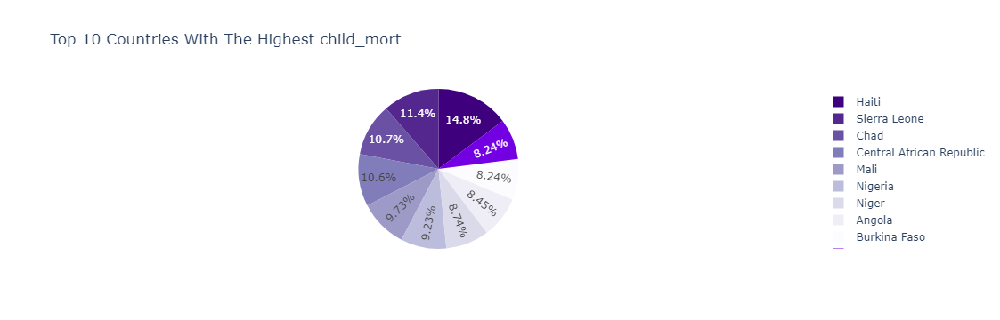

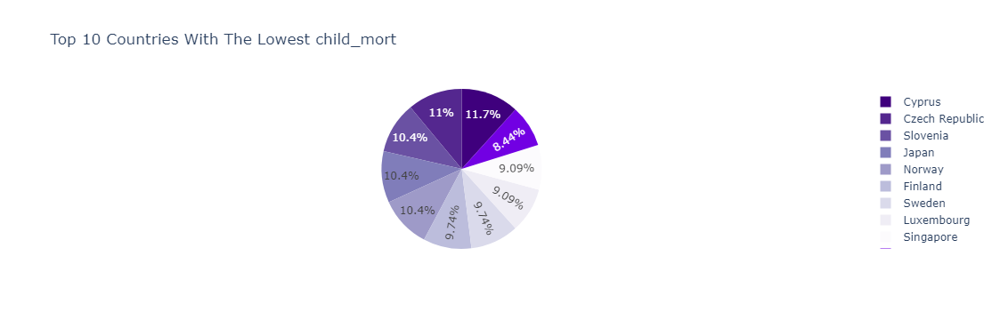

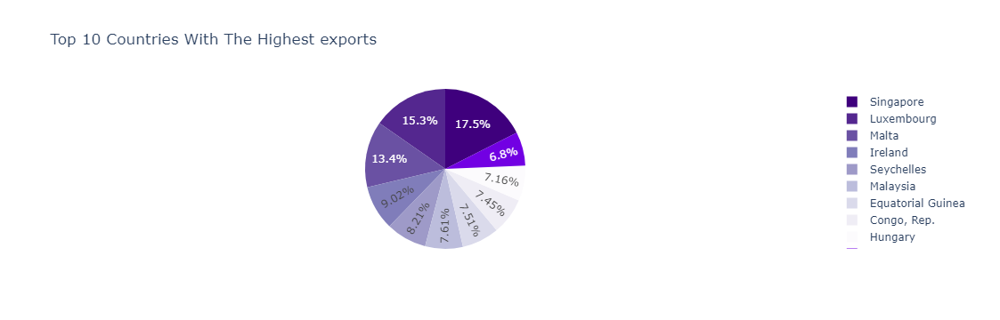

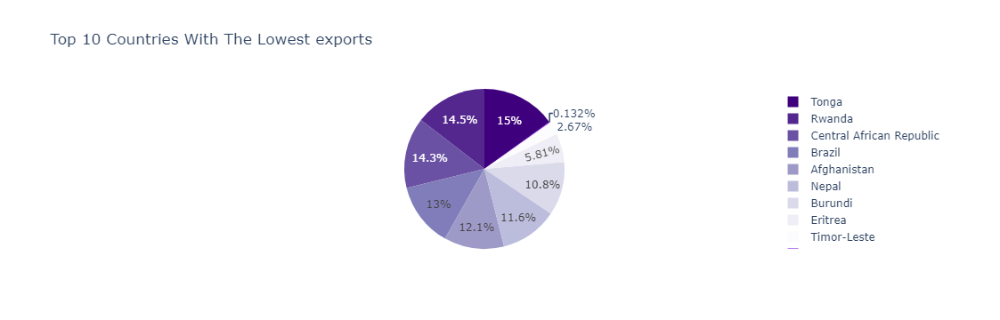

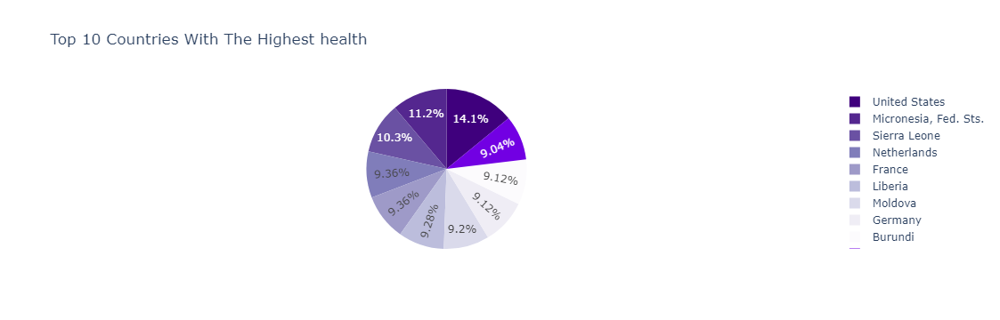

...

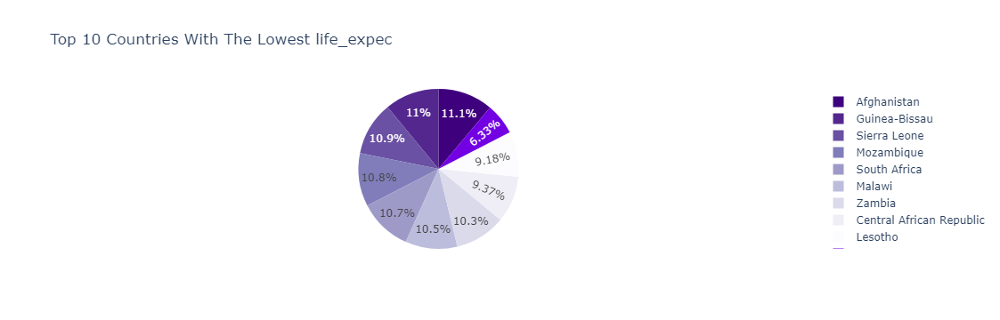

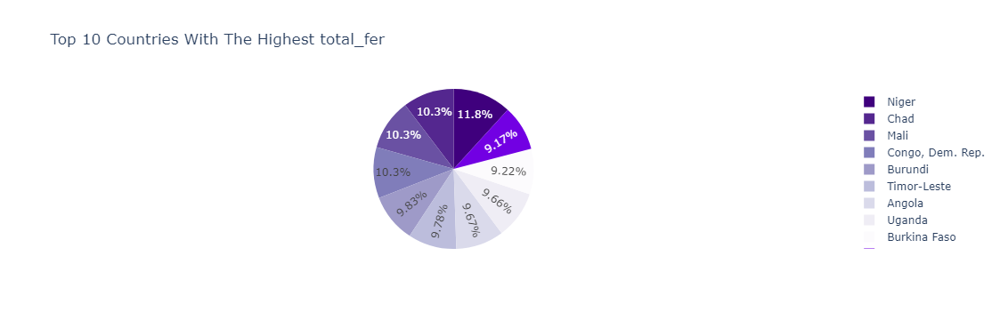

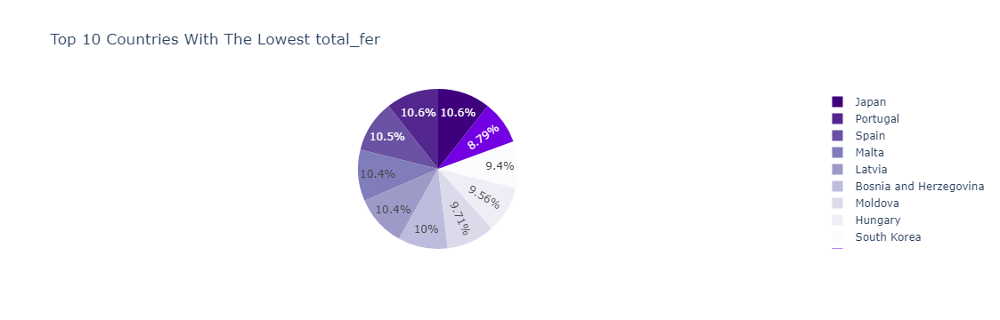

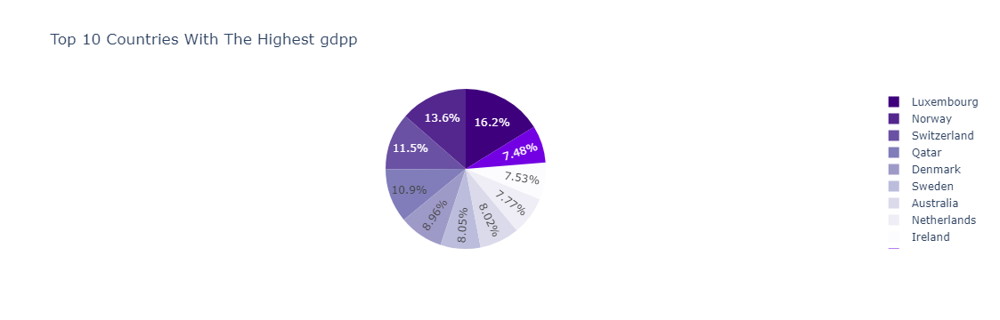

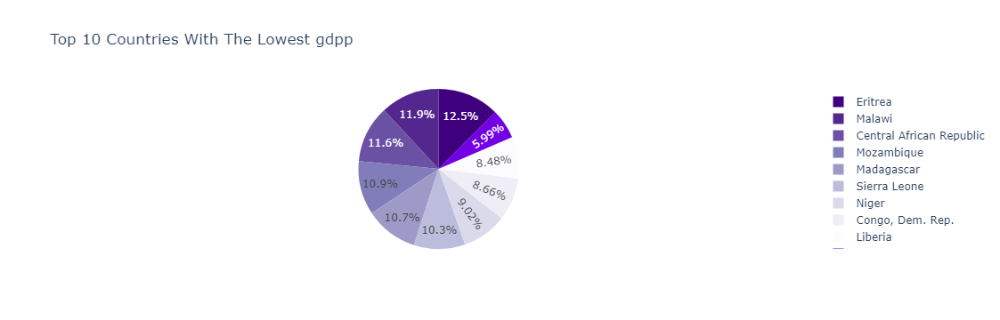

In [25]:
for column in country_data.drop(columns=['country']).columns:
    pie_chart_highest(country_data, column)
    pie_chart_lowest(country_data, column)

# Check for Outliers using BoxPlot in plotly.express

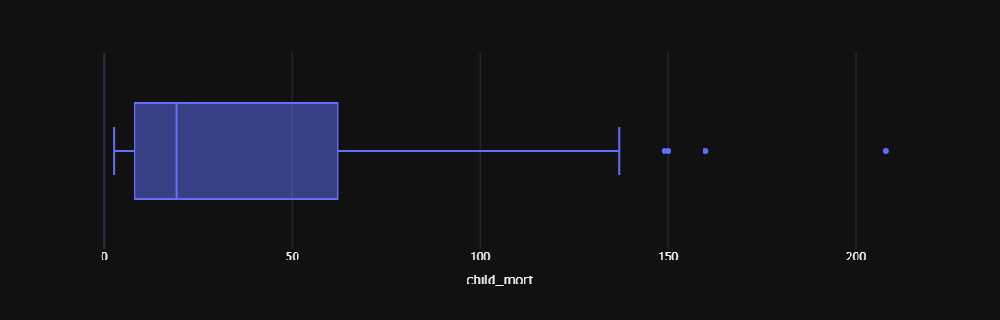

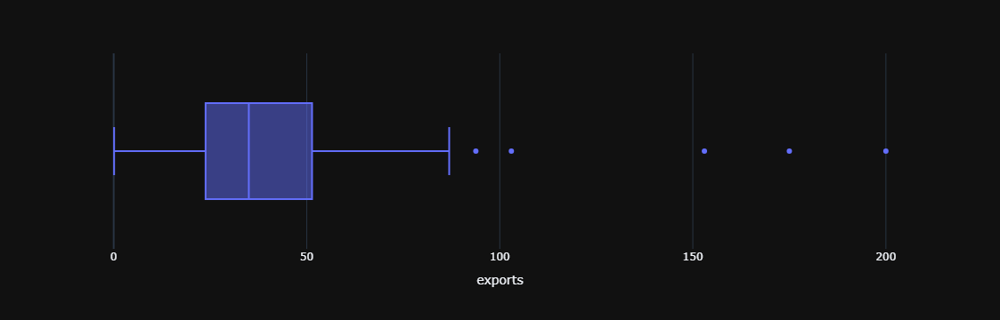

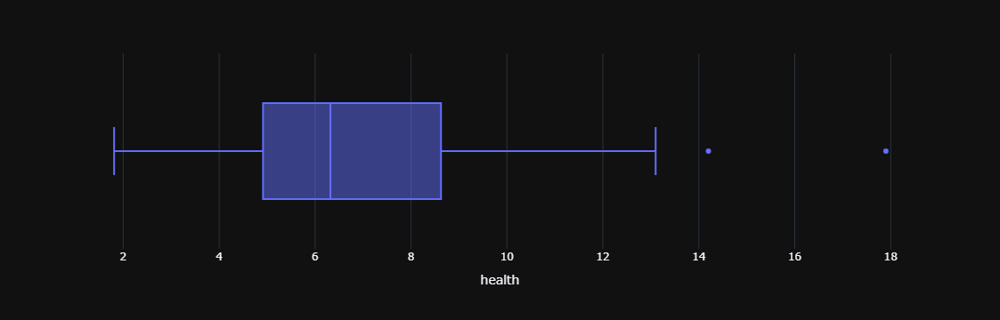

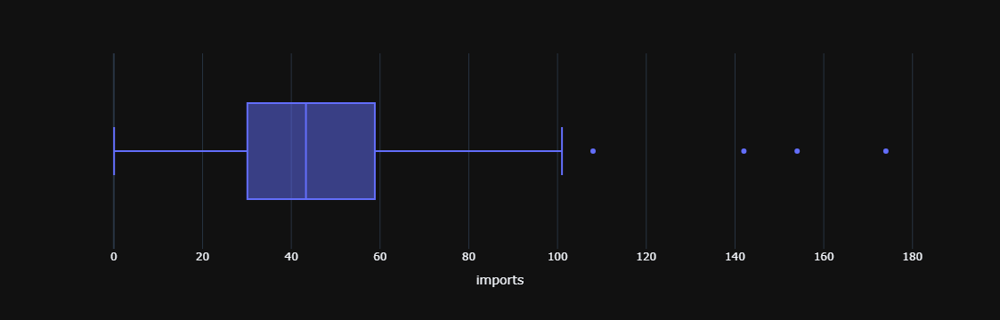

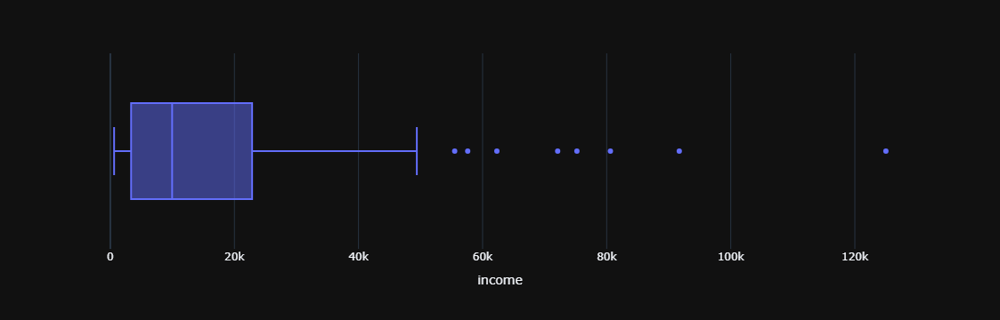

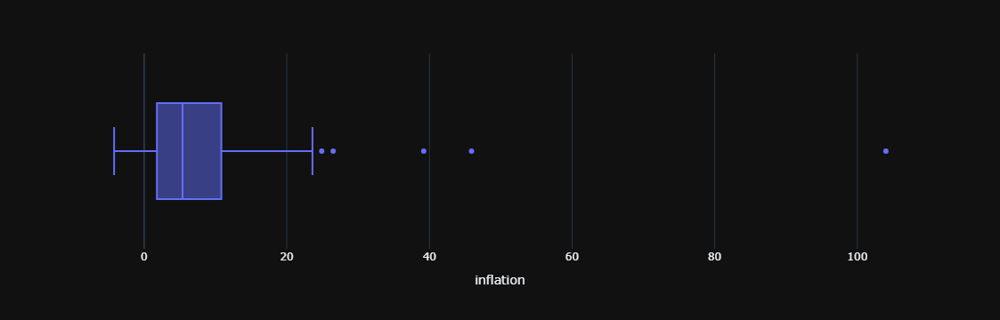

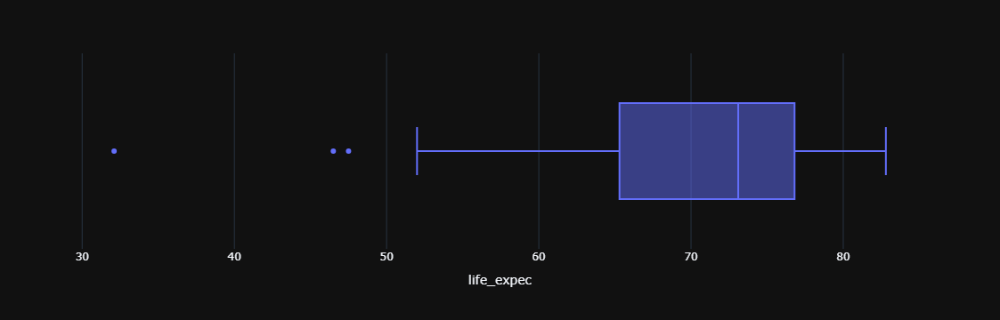

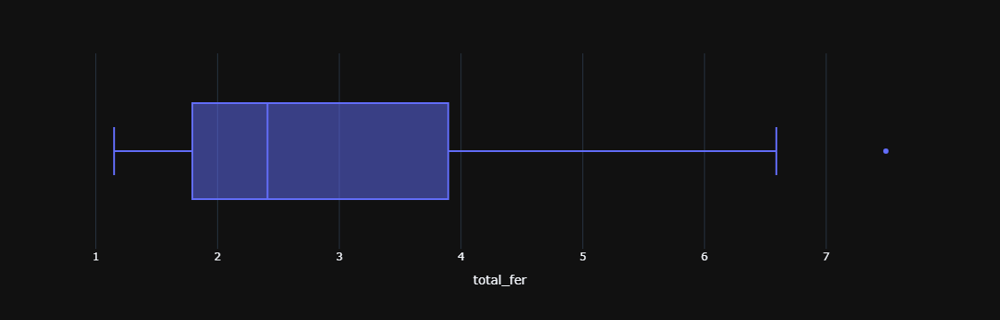

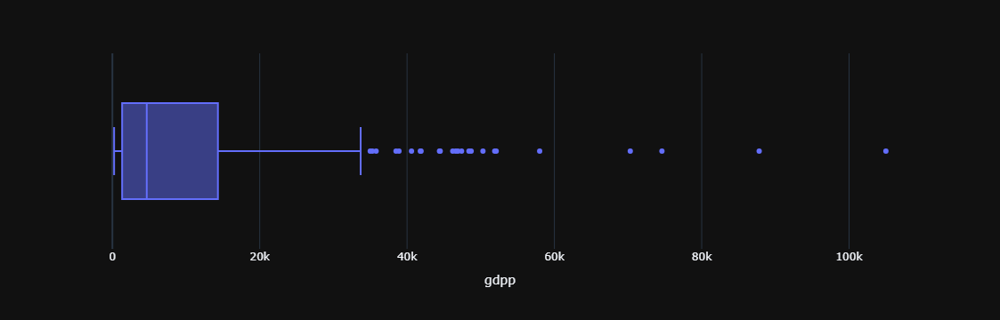

In [26]:
cols =[ 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']

for column in cols:
    fig= px.box(country_data, x=country_data[column])
    fig.update_layout(template='plotly_dark')
    fig.show()

$Interpretaion$: there are alot of data unusually displayed. hence needs to be  fixed before preparing for modeling.
I can able to see that there are unusual data like gbp from 35K to 105K  lets fixed the gdp on y axis and check the impact on other features.

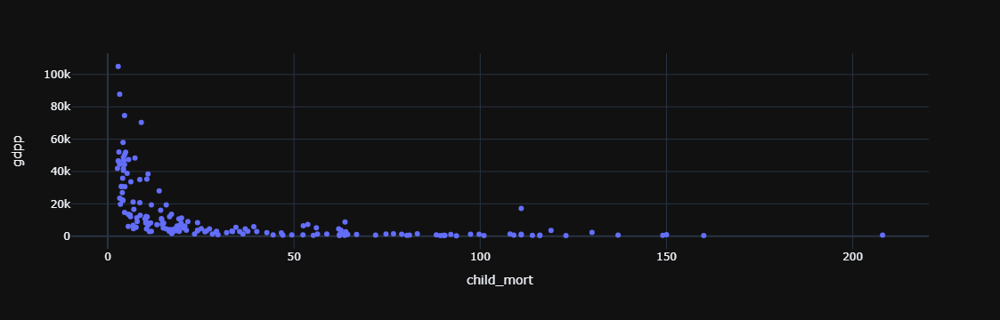

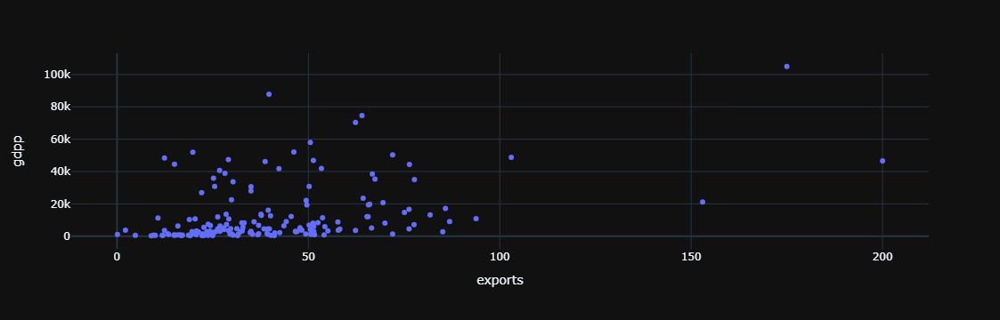

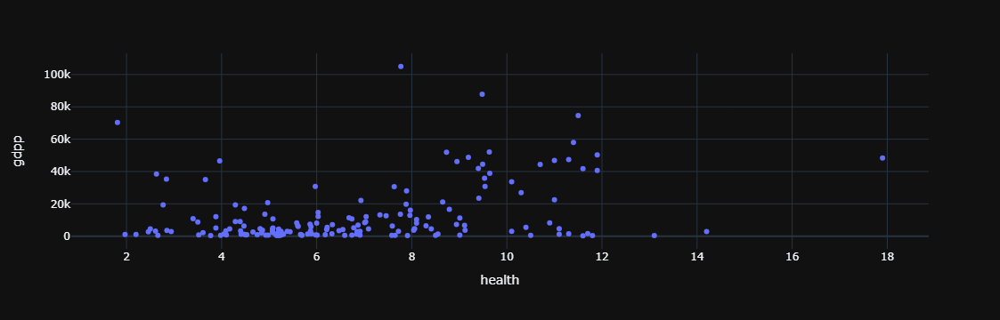

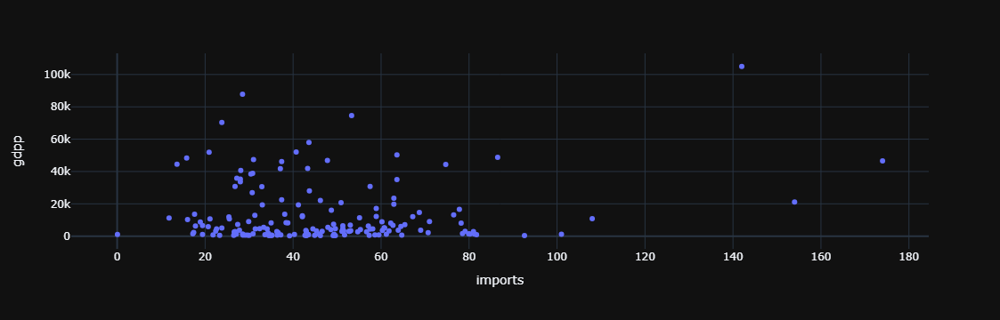

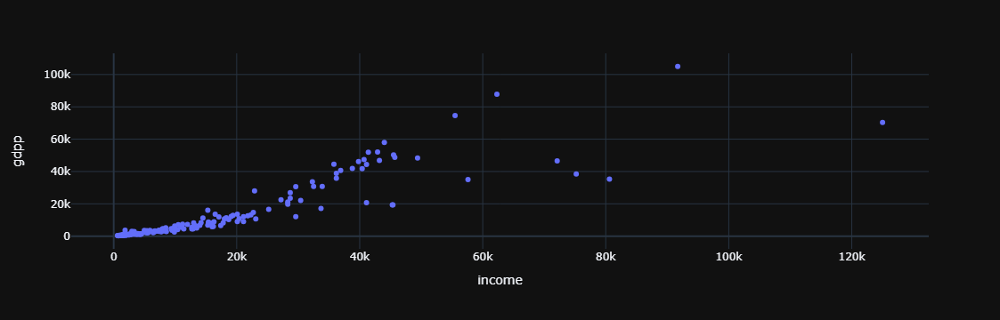

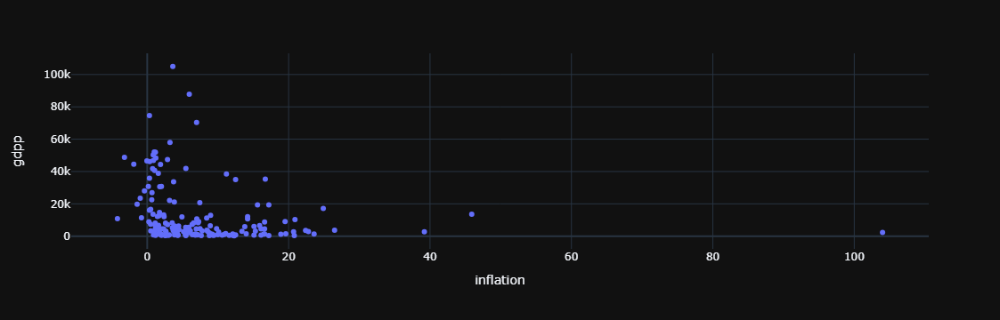

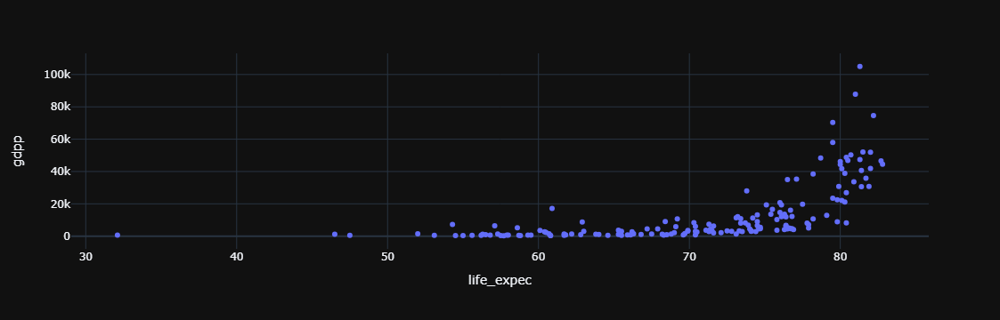

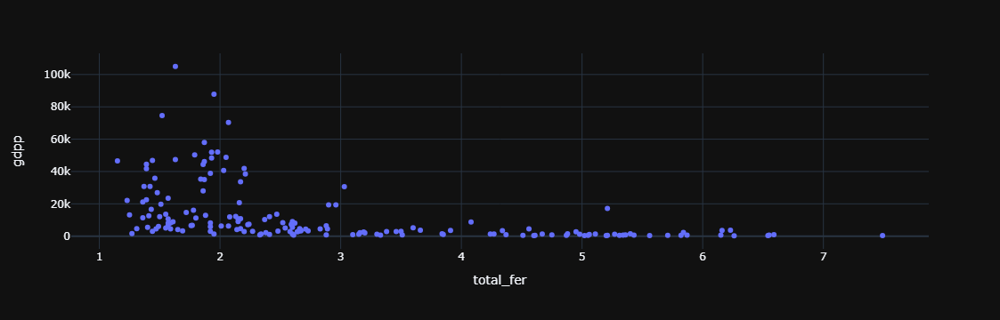

In [27]:
# fix the gdpp on the y-axis and make plots for any unusual changes.

for column in country_data.drop(columns = ['country', 'gdpp']).columns:
    fig = px.scatter(country_data, x=country_data[column], y='gdpp')
    fig.update_layout(template = 'plotly_dark')
    fig.show()

$Interpretation:$ we can see that gdp in each case seems to be high where the inflation rate was  104%, child morth is 208, fertility rate 8%

# In this project, two cases are checked. 
* In one case, the outliers were not considered, and 
* in the next case, I considered them and then I chose 

In [28]:
#the best case.
#Let's find these outliers.

# child_mort < 200 

df_f1 = country_data[country_data['child_mort'] < 200]
# exports < 150
df_f2 = df_f1[df_f1['exports'] < 150]
# health < 16
df_f3 = df_f2[df_f2['health'] < 16]
# imports < 120
df_f4 = df_f3[df_f3['imports'] < 120]
# income < 120000
df_f5 = df_f4[df_f4['income'] < 120000]
# inflation < 60
df_f6 = df_f5[df_f5['inflation'] < 60]
# life_expec > 40
df_f7 = df_f6[df_f6['life_expec'] > 40]
# total_fer < 7
df_f8 = df_f7[df_f7['total_fer'] < 7]
# gdpp < 80000
df_f = df_f8[df_f8['gdpp'] < 80000]
df_f                                            # The final data frame without outliers.


,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [29]:
# lets plot them in the form of scatter plot

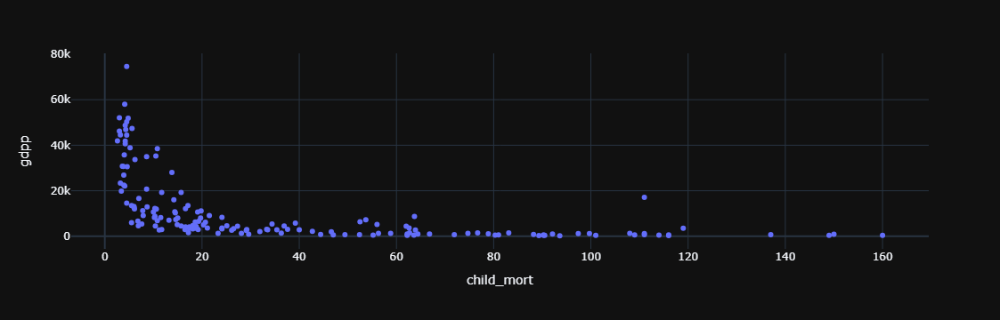

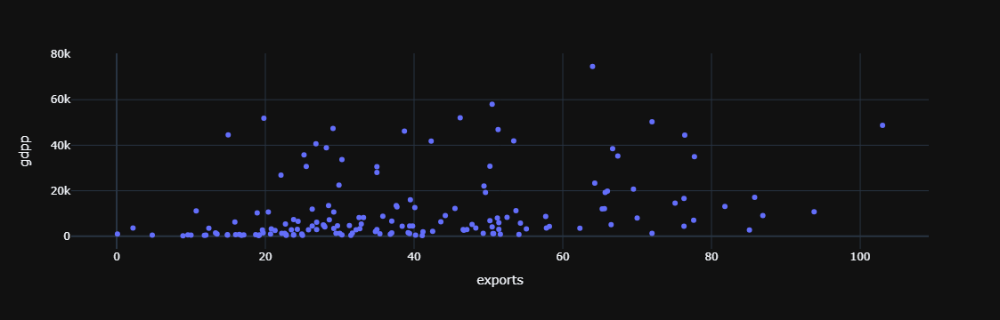

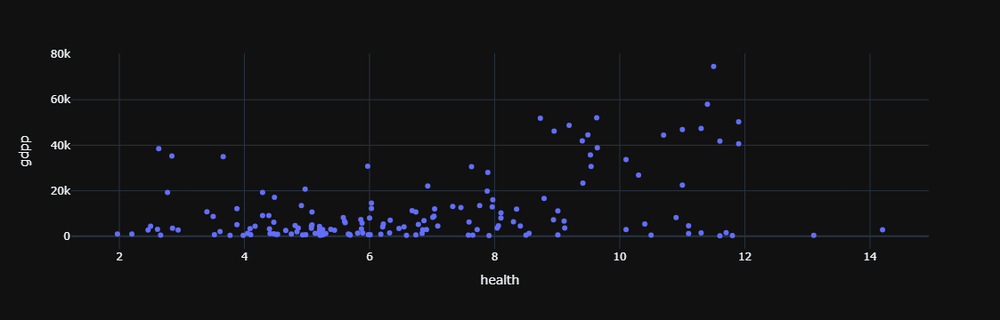

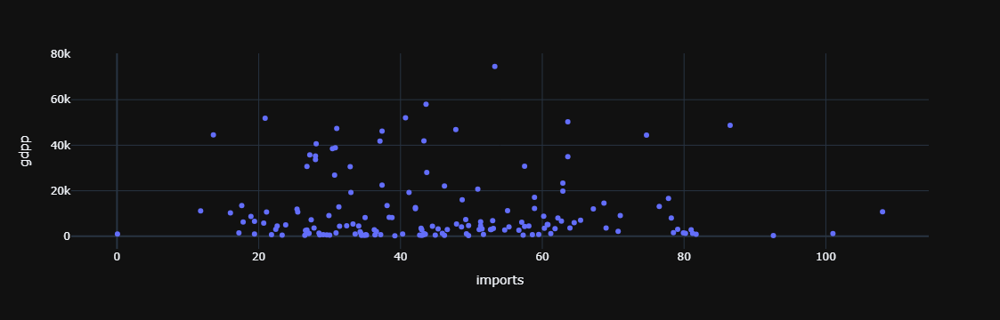

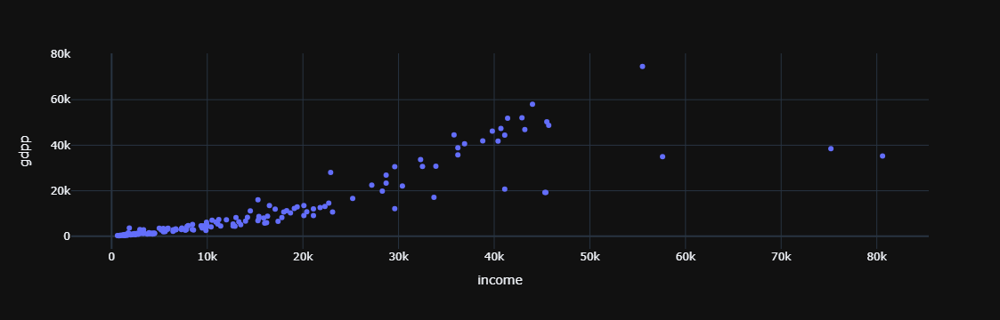

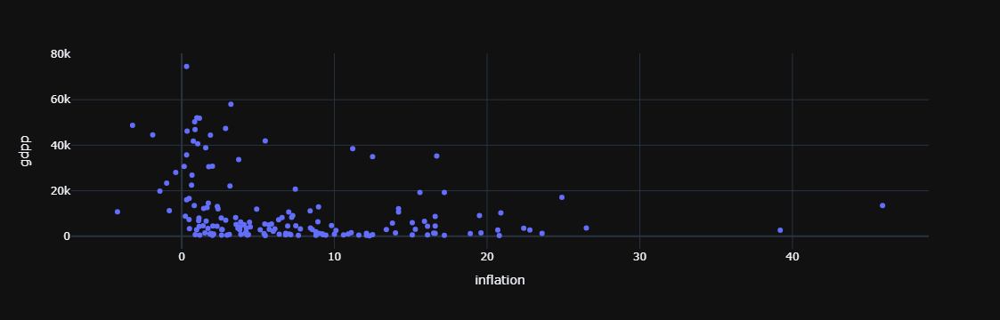

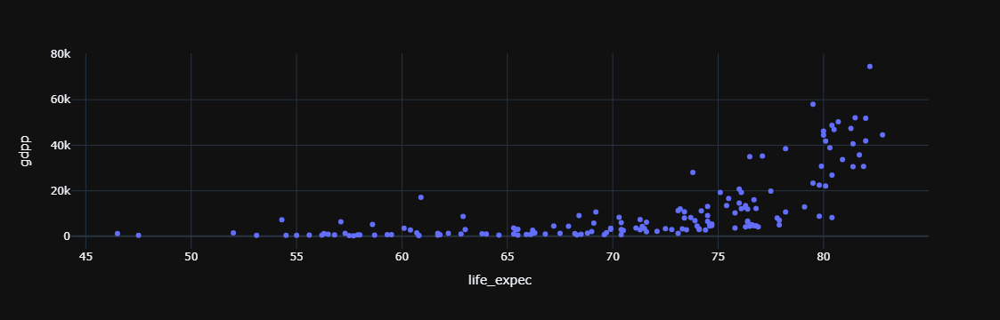

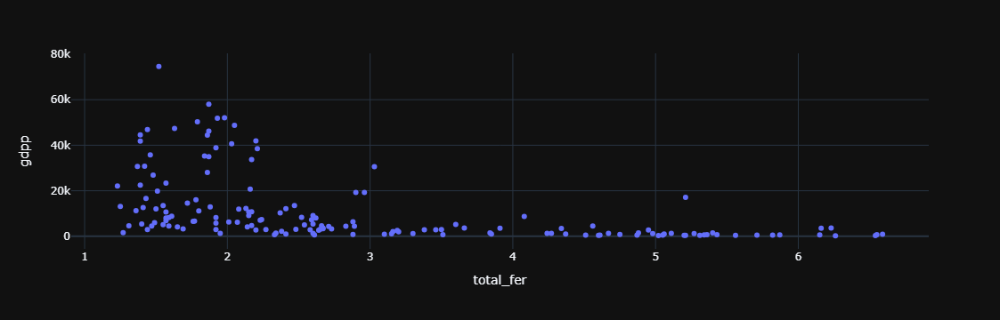

In [30]:
for column in df_f.drop(columns = ['country', 'gdpp']).columns:
    fig = px.scatter(df_f, x=df_f[column], y='gdpp')
    fig.update_layout(template = 'plotly_dark')
    fig.show()

# $DISTRIBUTION$ $OF$ $DATA $ $ON$ $WOLRDMAP$


* To draw these plots, we need access to the name of continents and the latitude and longitude of the countries in our dataset.

# Add name of continents:

I edited the names of some countries because they were written in abbreviation form and could not be identified by the 'pycountry' library.

In [31]:
country_2 =country_data.copy()
country_2.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [32]:
country_2['country']

0              Afghanistan
1                  Albania
2                  Algeria
3                   Angola
4      Antigua and Barbuda
              ...         
162                Vanuatu
163              Venezuela
164                Vietnam
165                  Yemen
166                 Zambia
Name: country, Length: 167, dtype: object

In [33]:
#Lets Replace the above abbrevation into proper from
country_2['country'] = country_2['country'].replace('Congo, Dem. Rep.', 'Democratic Republic of the Congo')
country_2['country'] = country_2['country'].replace('Congo, Rep.', 'Republic of the Congo')
country_2['country'] = country_2['country'].replace('''Cote d'Ivoire''', 'Ivory Coast')
country_2['country'] = country_2['country'].replace('Lao', 'Laos')
country_2['country'] = country_2['country'].replace('Macedonia, FYR', 'Macedonia')
country_2['country'] = country_2['country'].replace('Micronesia, Fed. Sts.', 'Federated States of Micronesia')
country_2['country'] = country_2['country'].replace('St. Vincent and the Grenadines', 'Saint Vincent and the Grenadines')
country_2['country'] = country_2['country'].replace('St. Vincent and the Grenadines', 'Saint Vincent and the Grenadines')
country_2['country'] = country_2['country'].replace('Timor-Leste', 'East Timor')

In [34]:
# Adding a new column 'Continent' to the DataFrame and filled with nan values
country_2['Continent'] = np.NaN

# Iterating through each row in the DataFrame
for i in range(len(country_2)):
    try:
        # Get country code using country name by using librabry pycountry_convert
        country_code = pc.country_name_to_country_alpha2(country_2.country.iloc[i],cn_name_format="default")
        
        # Get continent name from country code
        country_2['Continent'].iloc[i]=pc.country_alpha2_to_continent_code(country_code)
        
    except KeyError:
        # Handle cases where the country name is not recognized
        country_2['Continent'].iloc[i]= 'Invalid'
        
# Note: This code adds a 'Continent' column to the DataFrame and populates it with continent codes or 'Invalid' if not found.

# Explanation of Above Code:
* for i in range(len(country_2)):: This for loop iterates through each row in the DataFrame df2. It uses the index i to access each row.

* try:: The code within this block is enclosed in a try block. It means that if any errors occur during execution, they will be caught and handled gracefully without causing the script to crash.

* country_code = pc.country_name_to_country_alpha2(country_2.country.iloc[i], cn_name_format="default"): In this line, the country_name_to_country_alpha2 function from the pycountry_convert library is used to convert the country name in the current row (retrieved with df2.country.iloc[i]) to its corresponding ISO 3166-1 alpha-2 country code. This code is a two-letter code that uniquely identifies a country.

* df2['Continent'].iloc[i] = pc.country_alpha2_to_continent_code(country_code): The country_alpha2_to_continent_code function is used to get the continent code (e.g., 'AF' for Africa) associated with the country code obtained in the previous step. It then assigns this continent code to the 'Continent' column in the current row of the DataFrame.

* except KeyError:: If a KeyError is raised during the execution of the try block, it means that the country name in the current row was not recognized or could not be mapped to a country code. In such cases, 'Invalid' is assigned to the 'Continent' column in the current row using df2['Continent'].iloc[i].

* In summary, this code iterates through each row of the DataFrame, attempts to convert the country name to a country code, and then maps the country code to a continent code. If the country name is not recognized, it marks the row with 'Invalid' in the 'Continent' column.

* Please ensure that you have the pycountry_convert library installed and imported correctly for this code to work as intended.






In [35]:
# lets check the continent 

country_2[country_2['Continent']=='Invalid']    #  This will result in a DataFrame containing only the rows where the continent couldn't be determined and was marked as 'Invalid' in the 'Continent' column.

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Continent
149,East Timor,62.6,2.2,9.12,27.8,1850,26.5,71.1,6.23,3600,Invalid


East Timor, also known as Timor-Leste, is located in the continent of Asia.

In [36]:
 # Assigning the continent 'Asia' to the 'Continent' column for the row at index 149
country_2.loc[149,'Continent']='Asia'


In [37]:
country_2.Continent

0      AS
1      EU
2      AF
3      AF
4      NA
       ..
162    OC
163    SA
164    AS
165    AS
166    AF
Name: Continent, Length: 167, dtype: object

In [38]:
country_2.Continent.value_counts()

AF      47
AS      44
EU      39
NA      15
SA      12
OC       9
Asia     1
Name: Continent, dtype: int64

*  the continent codes in the 'Continent' column ('SA', 'NA', 'AS', 'OC', 'EU', 'AF') will be replaced with their corresponding full continent names.


In [39]:
country_2.Continent.replace({'AF':'Africa','AS':'Asia','EU':'Europe','NA':'North America','SA':'South America','OC':'Australia'}, inplace=True)


In [40]:
country_2['Continent'].value_counts()

Africa           47
Asia             45
Europe           39
North America    15
South America    12
Australia         9
Name: Continent, dtype: int64

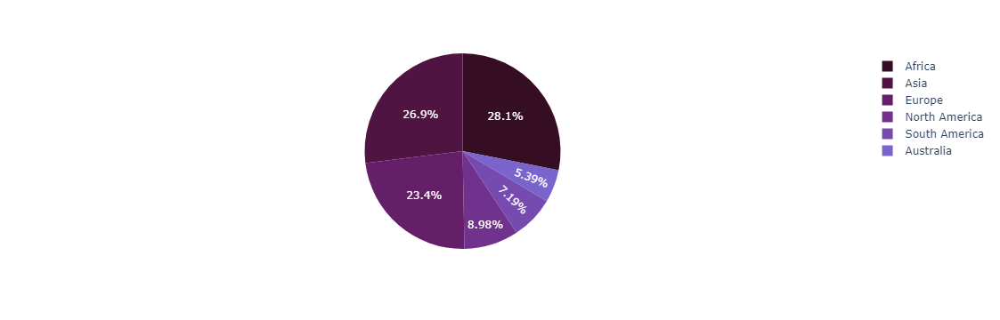

In [41]:
# First of all, let's see the share of each continent in our dataset.
df_count = pd.DataFrame({'Value':country_2['Continent'].value_counts().index,'Count':country_2['Continent'].value_counts().values})
fig = px.pie(df_count, values='Count', names='Value', color_discrete_sequence=px.colors.sequential.dense_r)
fig.show()
#color_discrete_sequence parameter to specify a color palette for the chart.


In [42]:
country_2.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Continent
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Asia
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Europe
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Africa
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Africa
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,North America


# Add longitude and lattitude:

In [43]:
# Creating new columns 'Longitude' and 'Latitude' for location information
country_2["Longitude"] = np.NaN
country_2["Latitude"] = np.NaN

# Using the Nominatim method from geopy.geocoders to find location coordinates
geolocator = Nominatim(user_agent="aa")
for i in range(len(country_2)):
    try:
        # Constructing the location query using country and institution names
        Loc = country_2.country.iloc[i] + "," + country_2.Institution.iloc[i]
        
        # Getting address details using geolocator
        address = geolocator.geocode(Loc)
        
        # Updating Latitude and Longitude columns with location coordinates
        country_2["Latitude"].iloc[i] = address.latitude
        country_2["Longitude"].iloc[i] = address.longitude
    
    except:
        # If institution name is not available, using only country name
        Loc = country_2.country.iloc[i]
        address = geolocator.geocode(Loc)
        
        # Updating Latitude and Longitude columns with location coordinates
        country_2["Latitude"].iloc[i] = address.latitude
        country_2["Longitude"].iloc[i] = address.longitude


In [44]:
country_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
 10  Continent   167 non-null    object 
 11  Longitude   167 non-null    float64
 12  Latitude    167 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 17.1+ KB


Hence, successfully we have inserted the longitudnal and latitudnal colume with their geographic codes with the help of geocoder,gelocator

In [45]:
country_2.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp', 'Continent',
       'Longitude', 'Latitude'],
      dtype='object')

 # Calculate and organize information about missing values, NaN counts, and unique values in the DataFrame


In [46]:
null = country_2.isnull().sum().to_frame(name='isNull').T
na = country_2.isna().sum().to_frame(name='isNa').T
unique = country_2.nunique().to_frame(name='Unique').T

# Concatenate the calculated information into a summary DataFrame
info2 = pd.concat([null, na, unique])
info2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Continent,Longitude,Latitude
isNull,0,0,0,0,0,0,0,0,0,0,0,0,0
isNa,0,0,0,0,0,0,0,0,0,0,0,0,0
Unique,167,139,147,147,151,156,156,127,138,157,6,167,167


In [47]:
country_2.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,167,167,Afghanistan,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
child_mort,167.0,NaN,NaN,NaN,38.27006,40.328931,2.6,8.25,19.3,62.1,208.0
exports,167.0,NaN,NaN,NaN,41.108976,27.41201,0.109,23.8,35.0,51.35,200.0
health,167.0,NaN,NaN,NaN,6.815689,2.746837,1.81,4.92,6.32,8.6,17.9
imports,167.0,NaN,NaN,NaN,46.890215,24.209589,0.0659,30.2,43.3,58.75,174.0
income,167.0,NaN,NaN,NaN,17144.688623,19278.067698,609.0,3355.0,9960.0,22800.0,125000.0
inflation,167.0,NaN,NaN,NaN,7.781832,10.570704,-4.21,1.81,5.39,10.75,104.0
life_expec,167.0,NaN,NaN,NaN,70.555689,8.893172,32.1,65.3,73.1,76.8,82.8
total_fer,167.0,NaN,NaN,NaN,2.947964,1.513848,1.15,1.795,2.41,3.88,7.49
gdpp,167.0,NaN,NaN,NaN,12964.155689,18328.704809,231.0,1330.0,4660.0,14050.0,105000.0


# Finally, you can see the distribution of samples around the world:

* Create a scatter map using Plotly Express (`px.scatter_mapbox`) based on the `country_2` DataFrame
* 'lat' parameter: Use the 'Latitude' column for latitude coordinates
* 'lon' parameter: Use the 'Longitude' column for longitude coordinates
* 'hover_name' parameter: Use the 'country' column for hover label text
* 'color' parameter: Use the 'country' column for color-coding the markers
* 'color_continuous_scale' parameter: Set the color scale for the markers
* 'hover_data' parameter: Additional columns to include in the hover tooltip
* 'zoom' parameter: Set the initial zoom level of the map
* 'mapbox_style' parameter: Set the initial map style (carto-positron)


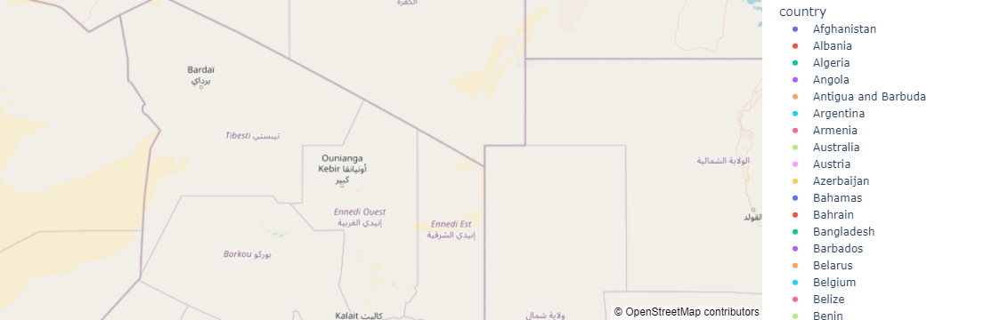

In [48]:
fig = px.scatter_mapbox(country_2, lat='Latitude',lon='Longitude', hover_name='country',color=country_2['country'],
                      color_continuous_scale= px.colors.cyclical.IceFire,
                      hover_data=["Continent","health","income","gdpp"],zoom=5,
                      mapbox_style="carto-positron")
#update the map style to open_street_map
fig.update_layout(mapbox_style="open-street-map")
# Update the layout by setting margins to control spacing around the map
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# Display the scatter map
fig.show()



In [49]:
#Let's see the distribution of each column on a world map:

# First, we define a function.

# These plots show the distribution of each column on a world map 
def choropleth(country_2, nam_feature):
    fig = px.choropleth(country_2,
                    locationmode='country names',
                    locations='country',
                    color=nam_feature,
                    color_continuous_scale = 'thermal',
                    title='Countries by '+nam_feature,
                   )

    fig.show()

    

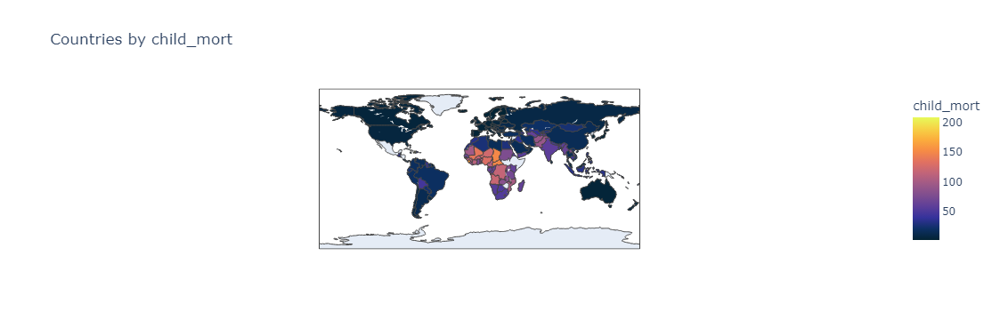

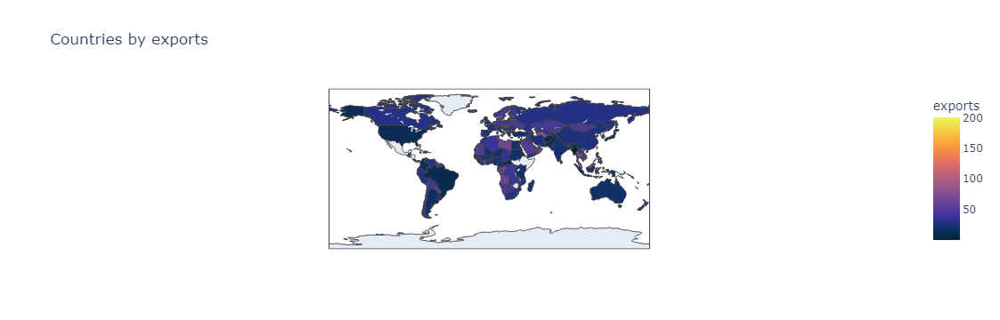

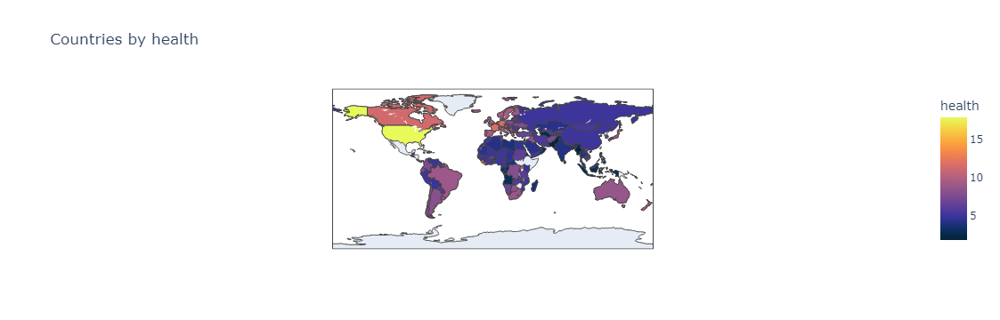

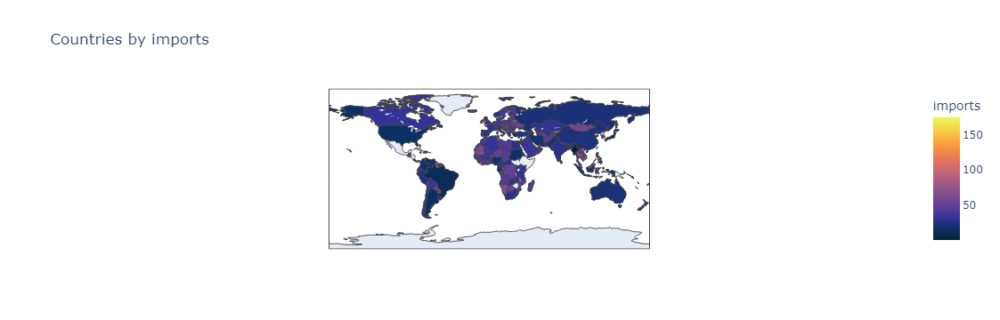

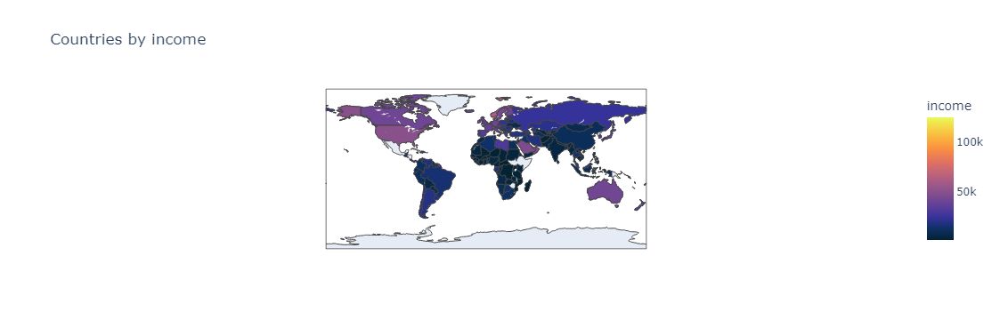

...

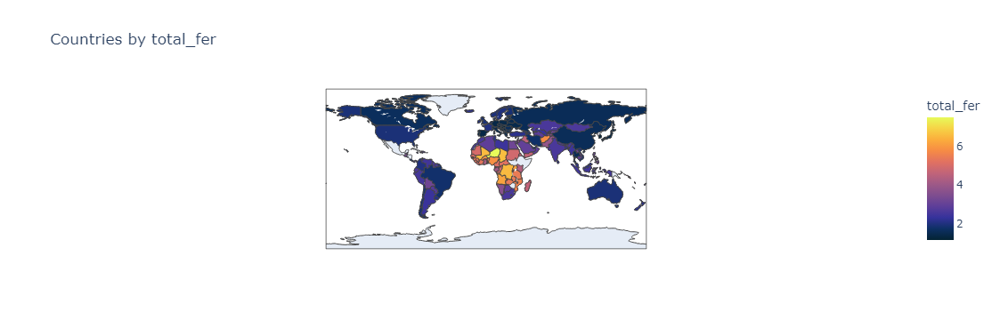

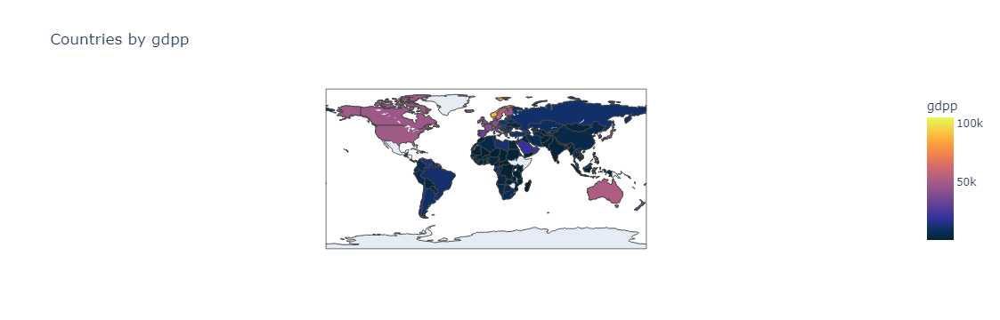

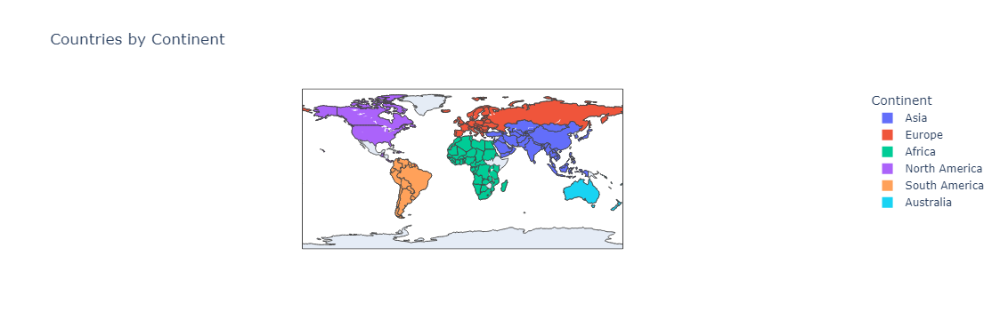

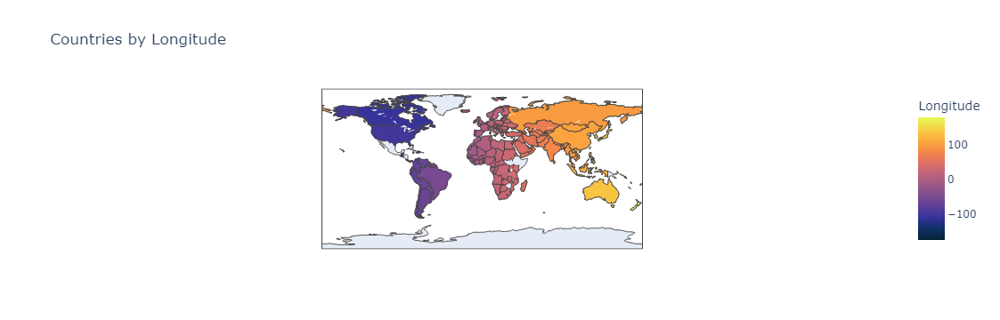

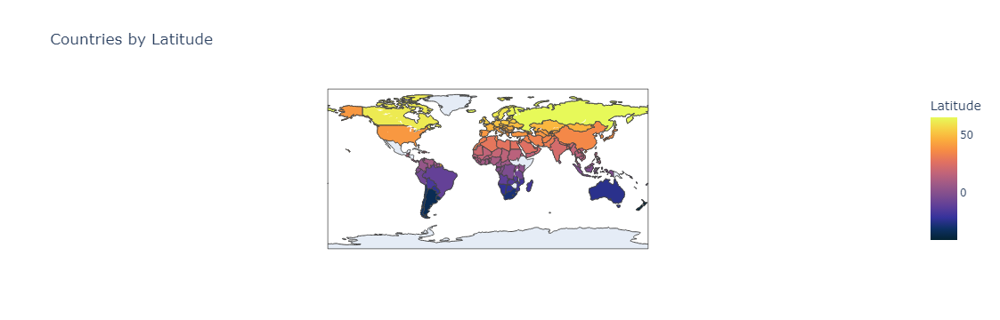

In [50]:
for column in country_2.drop(columns=['country']).columns:
    choropleth(country_2,column)

$Note$
 A function called choropleth to create choropleth maps for different columns of your DataFrame country_2. Choropleth maps visualize data by coloring different geographic regions (in this case, countries) based on a specific data attribute.

# For data modeling- Unsupervised Learning Algorithm


In [51]:
from sklearn.cluster import KMeans,MiniBatchKMeans,DBSCAN,AgglomerativeClustering,MeanShift,estimate_bandwidth
from sklearn.mixture import GaussianMixture
from kneed import KneeLocator
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
# Model Performance Import
from sklearn.metrics import silhouette_score,calinski_harabasz_score,davies_bouldin_score


$Note:$
* 1.Silhouette Score (silhouette_score):

The Silhouette Score measures how similar each data point in one cluster is to the other data points in the same cluster compared to the nearest neighboring cluster.
It ranges from -1 (a poor clustering) to +1 (a perfect clustering). Higher values indicate better clusterings.
It is often used for assessing the quality of clusters in unsupervised clustering tasks like K-Means.

* 2.Calinski-Harabasz Index (calinski_harabasz_score):

The Calinski-Harabasz Index (also known as the Variance Ratio Criterion) measures the ratio of between-cluster variance to within-cluster variance.
It tends to be higher for clusterings that are dense and well-separated, making it useful for finding the number of clusters in hierarchical clustering or K-Means.

* 3.Davies-Bouldin Index (davies_bouldin_score):

The Davies-Bouldin Index measures the average similarity between each cluster and its most similar cluster, where similarity is defined based on a distance metric.
It ranges from 0 (a perfect clustering) to positive infinity, with lower values indicating better clusterings.
It can be used to assess the quality of clusters, and lower values suggest better separation between clusters.
These metrics are commonly used in clustering analysis to evaluate the effectiveness and quality of clustering algorithms. Depending on your specific clustering task and goals, you can choose the most appropriate metric to assess the performance of your clustering model.






In [52]:
# lets drop the country column as it contains outliers
data =country_data.drop(columns=['country'],axis=1)
data.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [53]:
# lets do the same where no outliers datframe we created
df_fn = df_f.drop(columns = ['country'], axis=1)
df_fn.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [54]:
country_2.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Continent,Longitude,Latitude
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Asia,66.238514,33.768006
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Europe,19.999962,41.000028
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Africa,2.999983,28.000027
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Africa,17.569124,-11.877577
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,North America,-61.955461,17.223472


# lets scale the dataset.
* The purpose of scaling is to ensure that all features are on the same scale, which can be important for certain machine learning algorithms. Scaling helps to prevent features with larger numerical ranges from dominating the influence on the algorithms, which can lead to biased results. By standardizing the features, you ensure that each feature contributes equally to the model's learning process.

* It's important to note that not all algorithms require scaling. For example, tree-based models like decision trees and random forests are not sensitive to the scale of features.

* If you're using PCA to reduce dimensionality, scaling is necessary because PCA aims to find directions of maximum variance, and features with larger scales can disproportionately influence these directions.

In [55]:
# data: A data Frame that contains outliers. 
scaler = StandardScaler()                                              # Creates an instance of the StandardScaler class.
scaled_features = scaler.fit_transform(data)                            # Scaling values.
scaled_dataframe = pd.DataFrame(scaled_features, columns=data.columns)  # Create a new dataframe with scaled values.

In [56]:
# df_f: A data Frame without outliers.
scaler2 = StandardScaler()                                                    # Creates an instance of the StandardScaler class.
scaled_features2 = scaler.fit_transform(df_fn)                                # Scaling values.
scaled_dataframe2= pd.DataFrame(scaled_features2, columns=df_fn.columns)      # Create a new dataframe with scaled values.

In [57]:
scaled_dataframe

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817
...,...,...,...,...,...,...,...,...,...
162,-0.225578,0.200917,-0.571711,0.240700,-0.738527,-0.489784,-0.852161,0.365754,-0.546913
163,-0.526514,-0.461363,-0.695862,-1.213499,-0.033542,3.616865,0.546361,-0.316678,0.029323
164,-0.372315,1.130305,0.008877,1.380030,-0.658404,0.409732,0.286958,-0.661206,-0.637754
165,0.448417,-0.406478,-0.597272,-0.517472,-0.658924,1.500916,-0.344633,1.140944,-0.637754


In [58]:
scaled_dataframe2

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.420428,-1.420631,0.305469,-0.022342,-0.897090,0.271595,-1.736662,1.955935,-0.719970
1,-0.556955,-0.538475,-0.088664,0.172117,-0.354274,-0.380967,0.694803,-0.882583,-0.482608
2,-0.269482,-0.028785,-0.999379,-0.731853,-0.160504,1.149587,0.718996,-0.038516,-0.457778
3,2.194187,1.142523,-1.504481,-0.127455,-0.617200,1.980121,-1.264886,2.187373,-0.520189
4,-0.726215,0.319177,-0.287644,0.713448,0.243998,-0.783051,0.755287,-0.555847,0.061640
...,...,...,...,...,...,...,...,...,...
153,-0.218436,0.373087,-0.586113,0.387598,-0.809665,-0.627491,-0.914077,0.376711,-0.557769
154,-0.543522,-0.513970,-0.716216,-1.457132,0.074368,5.078143,0.585931,-0.324409,0.148881
155,-0.376949,1.617907,0.022305,1.832899,-0.709192,0.622264,0.307704,-0.678373,-0.669169
156,0.509650,-0.440457,-0.612899,-0.574184,-0.709844,2.138318,-0.369719,1.173130,-0.669169


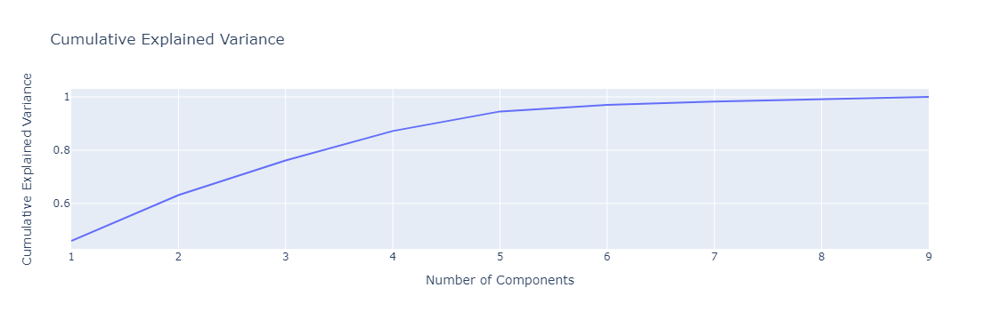

In [171]:
# Considerig Outliers Data for PCA dimensionality reduction techniques
pca =PCA()
pca.fit_transform(scaled_dataframe)
# Plotting the cumulative explained variance to visualize the contribution of each principal component
# Matplotlib Code:
#plt.plot(np.cumsum(pca.explained_variance_ratio_))

#plt.xlabel('number of components')
#plt.ylabel('cumulative explained variance')




# Here I am using plotly express to plot the graph:
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Create a DataFrame for the cumulative explained variance
cumulative_variance_df = pd.DataFrame({'Number of Components': range(1, len(cumulative_variance) + 1),
                                       'Cumulative Explained Variance': cumulative_variance})

# Create the cumulative explained variance plot using Plotly Express
fig = px.line(cumulative_variance_df, x='Number of Components', y='Cumulative Explained Variance',
              title='Cumulative Explained Variance')
fig.update_xaxes(title='Number of Components')
fig.update_yaxes(title='Cumulative Explained Variance')

# Show the plot
fig.show()



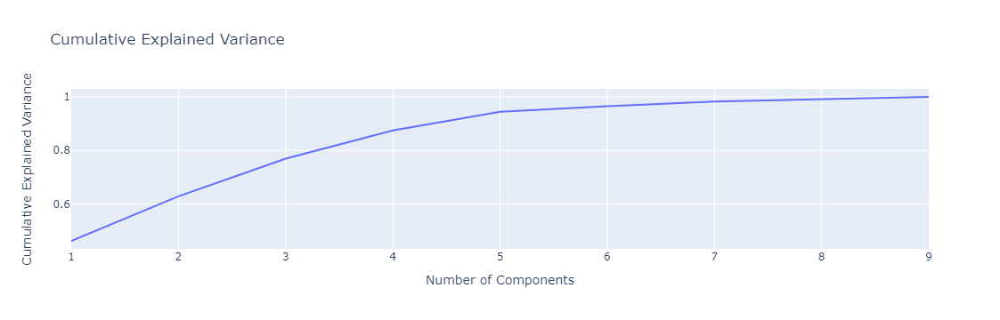

In [172]:
# Considering data df_fn without outliers for PCA  dimensionality reduction techniques
pca1 =PCA()
pca1.fit_transform(scaled_dataframe2)

#plt.plot(np.cumsum(pca1.explained_variance_ratio_))
#plt.xlabel("Number of Components")
#plt.ylabel("Cumulative Explained Variance")

# Here I am using plotly express to plot the graph:
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca1.explained_variance_ratio_)

# Create a DataFrame for the cumulative explained variance
cumulative_variance_df = pd.DataFrame({'Number of Components': range(1, len(cumulative_variance) + 1),
                                       'Cumulative Explained Variance': cumulative_variance})

# Create the cumulative explained variance plot using Plotly Express
fig = px.line(cumulative_variance_df, x='Number of Components', y='Cumulative Explained Variance',
              title='Cumulative Explained Variance')
fig.update_xaxes(title='Number of Components')
fig.update_yaxes(title='Cumulative Explained Variance')

# Show the plot
fig.show()


In [61]:
# Considering outliers.
pca =PCA(n_components=3) # Import the PCA class from the scikit-learn library and create an instance with 3 components
  # Fit the PCA model to the scaled data in scaled_dataframe
                                                       
pca.fit(scaled_dataframe)
# Transform the scaled data into its principal components
data_pca =pca.transform(scaled_dataframe)

df_pca= pd.DataFrame(data_pca,columns=['PCA1','PCA2','PCA3'])
df_pca
                                    
 # Create a new DataFrame df_pca to store the principal components with appropriate column names


,PCA1,PCA2,PCA3
0,-2.913025,0.095621,-0.718118
1,0.429911,-0.588156,-0.333486
2,-0.285225,-0.455174,1.221505
3,-2.932423,1.695555,1.525044
4,1.033576,0.136659,-0.225721
...,...,...,...
162,-0.820631,0.639570,-0.389923
163,-0.551036,-1.233886,3.101350
164,0.498524,1.390744,-0.238526
165,-1.887451,-0.109453,1.109752


In [62]:
# Without considering outliers.
pca2 = PCA(n_components=3)                                      # Import the PCA class from the scikit-learn library and create an instance with 3 components
pca2.fit(scaled_dataframe2)                                      # Fit the PCA model to the scaled data in scaled_dataframe
data_pca2 = pca2.transform(scaled_dataframe2)                     # Transform the scaled data into its principal components
df_pca2 = pd.DataFrame(data_pca2, columns=['PC1', 'PC2', 'PC3']) # Create a new DataFrame df_pca to store the principal components with appropriate column names
df_pca2

,PC1,PC2,PC3
0,-3.157346,-0.186172,-1.142797
1,0.523170,-0.163654,-0.227992
2,-0.276443,-0.832019,1.486766
3,-3.267228,0.767681,2.026595
4,1.233904,0.649348,0.024260
...,...,...,...
153,-0.870380,0.984045,-0.023983
154,-0.673632,-2.581426,3.377453
155,0.425853,2.248373,0.774712
156,-2.107043,-0.767815,1.247374



# 1.Kmeans
Let's break down each parameter:

init: This parameter determines the method used to initialize the centroids before clustering. In this case, "random" means that the initial cluster centroids will be randomly chosen from the data points. There are other options available, such as "k-means++" which is a smarter initialization that tends to result in better clustering in practice.

n_init: KMeans is a randomized algorithm, and it can converge to different solutions depending on the initial placement of centroids. To mitigate this randomness, the algorithm runs n_init times with different initializations and returns the best result. In this case, n_init=10 means that the algorithm will run 10 times with different random initializations and select the best clustering result from these runs.

max_iter: This parameter determines the maximum number of iterations the KMeans algorithm will run for a single initialization. The algorithm tries to converge and optimize the cluster centroids within these iterations. If convergence is not reached within max_iter, the algorithm stops, even if it has not yet found a perfect clustering solution.

random_state: This parameter is used to seed the random number generator. It ensures reproducibility of results so that if you run the KMeans algorithm with the same random_state value, you should get the same clustering result each time. Using a fixed random_state is useful for debugging and ensuring consistency when comparing different runs or experiments.


In [63]:
KMeans_dict ={'init':'random','n_init':10,'random_state':32, 'max_iter':300}

# Finding The optimal number of clusters:

In [64]:
inertia =[]
k_rng =range(1,11)
for k in k_rng:
    km=KMeans(n_clusters=k, **KMeans_dict)
    km.fit(df_pca)
    inertia.append(km.inertia_)

In [65]:
#List Down the Inertias
inertia

[1144.3484937500475,
 698.2438120841985,
 550.0644943746922,
 441.90900014811746,
 377.772571826344,
 332.0234207967925,
 291.0878808463441,
 254.02300369892885,
 228.45095727576813,
 210.09480844498796]

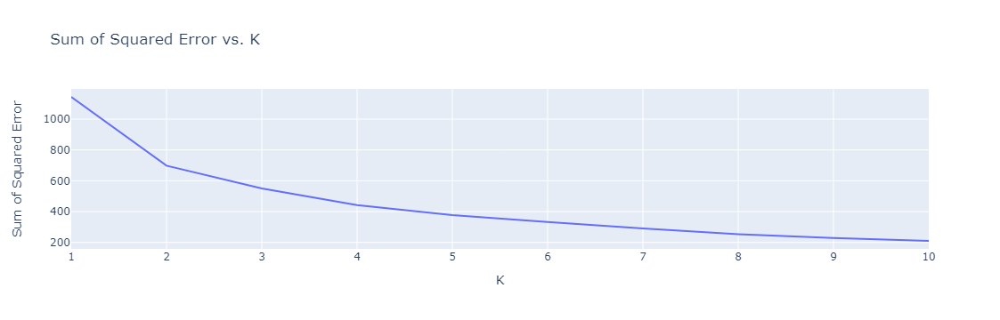

In [173]:
# Matplotlib
#plt.xlabel('K')
#plt.ylabel('Sum of squared error')
#plt.plot(k_rng,inertia)

# Create a DataFrame for the K values and inertia
inertia_df = pd.DataFrame({'K': k_rng, 'Inertia': inertia})

# Create the sum of squared error plot using Plotly Express
fig = px.line(inertia_df, x='K', y='Inertia', title='Sum of Squared Error vs. K')
fig.update_xaxes(title='K')
fig.update_yaxes(title='Sum of Squared Error')

# Show the plot
fig.show()

$Note:$
here curve =concave is elbow locator and curve= convex is knee locator

In [176]:
k =KneeLocator(range(1,11),inertia,curve="convex", direction='decreasing')
print("Optimal Number Of Clusters:",k.elbow)

Optimal Number Of Clusters: 4


1. Elbow Method: The idea behind the Elbow Method is to plot the explained variation as a function of the number of clusters and look for an "elbow point" where the rate of decrease in explained variation slows down, resembling an elbow. This point is often considered a reasonable estimate for the appropriate number of clusters.

Inertia: Inertia is calculated by summing the squared distances between each data point and the centroid of its assigned cluster.

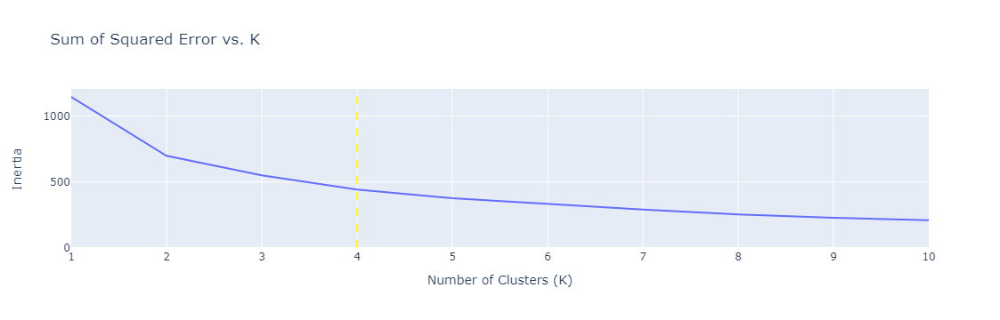

In [178]:
# Matplotlib
#plt.style.use('fivethirtyeight')
#plt.figure(figsize=(12,8))
#plt.plot(range(1,11),inertia)
#plt.xticks(range(1,11))
#plt.xlabel("Number Of cluster")
#plt.ylabel("Inertia")
#plt.axvline(x=k.elbow,color='y',label='anxlime-full hight',ls='--')
#plt.show()

k_elbow = 4
# Create the sum of squared error plot using Plotly Express
fig = px.line(inertia_df, x='K', y='Inertia', title='Sum of Squared Error vs. K')
fig.update_xaxes(title='Number of Clusters (K)')
fig.update_yaxes(title='Inertia')

# Add a vertical line at the elbow point
fig.add_shape(
    dict(type='line', x0=k_elbow, x1=k_elbow, y0=0, y1=max(inertia), line=dict(color='yellow', dash='dash'), name='Elbow Point')
)

# Show the plot
fig.show()

# Silhouette coefficient: 
The silhouette coefficient is a metric used to evaluate the quality of clustering in a dataset. It measures how well each data point fits into its assigned cluster by considering both its proximity to its own cluster and its distance to neighboring clusters. The silhouette coefficient ranges from -1 to 1, with higher values indicating better cluster quality. By calculating the average silhouette coefficient for different values of k (the number of clusters) and choosing the value that maximizes this metric, you can determine the optimal number of clusters for your clustering algorithm.

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b).

In [181]:
silhouette_coefficients=[]
for k in range(2,11):
    kmeans=KMeans(n_clusters=k,**KMeans_dict)
    kmeans.fit(df_pca)
    score=silhouette_score(df_pca,kmeans.labels_)
    silhouette_coefficients.append(score)

$Explanation$:                         
  *  List to hold the silhouette coefficients for each k
  * Iterate through a range of cluster counts, starting from 2
  * Create a KMeans instance with k clusters
  * Fit KMeans on the PCA-transformed data
  * Calculate the silhouette score for the current clustering
         

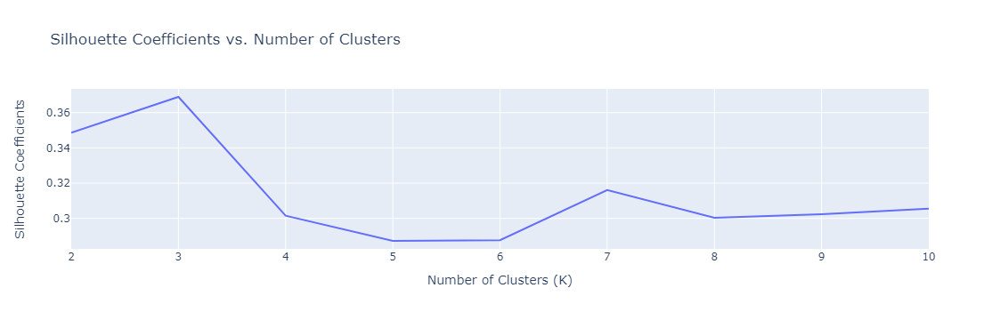

In [183]:
# Create a DataFrame for the K values and silhouette coefficients
silhouette_df = pd.DataFrame({'Number of Clusters (K)': range(2,11), 'Silhouette Coefficients': silhouette_coefficients})

# Create the silhouette coefficients plot using Plotly Express
fig = px.line(silhouette_df, x='Number of Clusters (K)', y='Silhouette Coefficients', 
              title='Silhouette Coefficients vs. Number of Clusters')
fig.update_xaxes(title='Number of Clusters (K)')
fig.update_yaxes(title='Silhouette Coefficients')

# Show the plot
fig.show()


# 3. Calinski-Harabasz Index:
Is another metric used to evaluate the quality of clusters in a clustering algorithm. Similar to the Silhouette Coefficient, it helps assess the separation and compactness of clusters. The Calinski-Harabasz Index aims to maximize the ratio of between-cluster variance to within-cluster variance, indicating well-defined and well-separated clusters.

The index is calculated using the following formula:
Calinski-Harabasz Index = (Between-Cluster Variance) / (Within-Cluster Variance) * (Number of Data Points - Number of Clusters) / (Number of Clusters - 1)

In [71]:
calinski_Harabasz_index =[]
for k in range(2,11):
    kmeans=KMeans(n_clusters=k,**KMeans_dict)
    kmeans.fit(df_pca)
    score=calinski_harabasz_score(df_pca,kmeans.labels_)
    calinski_Harabasz_index.append(score)

$Explanation$:
 * Calculate Calinski-Harabasz Index for different numbers of clusters
* List to hold the Calinski-Harabasz indices for each k
*  Iterate through a range of cluster counts, starting from 2
* Create a KMeans instance with k clusters    
* Fit KMeans on the PCA-transformed data
* Calculate the Calinski-Harabasz score for the current clustering
* Store the score in the list

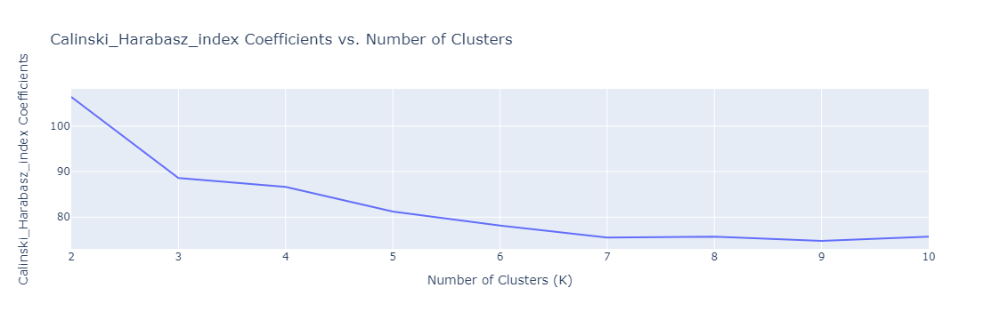

In [184]:
# Create a DataFrame for the K values and calinski_Harabasz_index
calinski_Harabasz_df = pd.DataFrame({'Number of Clusters (K)': range(2,11), 'calinski_Harabasz_index': calinski_Harabasz_index})

# Create the silhouette coefficients plot using Plotly Express
fig = px.line(calinski_Harabasz_df, x='Number of Clusters (K)', y='calinski_Harabasz_index', 
              title='Calinski_Harabasz_index Coefficients vs. Number of Clusters')
fig.update_xaxes(title='Number of Clusters (K)')
fig.update_yaxes(title='Calinski_Harabasz_index Coefficients')

# Show the plot
fig.show()


# According to the results, we consider the number of clusters equal to 4.

# Prediction1



In [73]:
kmeans.labels_

array([5, 4, 2, 1, 4, 2, 2, 8, 8, 2, 4, 9, 2, 4, 3, 6, 3, 5, 3, 3, 4, 3,
       4, 9, 4, 5, 5, 3, 5, 8, 3, 5, 5, 4, 2, 4, 5, 5, 1, 4, 5, 4, 6, 6,
       8, 4, 4, 2, 4, 1, 5, 6, 3, 8, 8, 1, 5, 4, 8, 5, 8, 4, 3, 5, 5, 3,
       5, 6, 8, 2, 2, 2, 3, 6, 4, 8, 3, 8, 3, 2, 5, 0, 9, 3, 3, 6, 4, 0,
       0, 9, 6, 7, 4, 5, 5, 6, 6, 5, 7, 1, 6, 0, 4, 1, 4, 3, 5, 2, 3, 2,
       8, 8, 5, 1, 8, 9, 5, 6, 3, 2, 3, 4, 8, 9, 4, 2, 5, 3, 9, 5, 4, 6,
       5, 7, 6, 6, 0, 3, 8, 8, 2, 3, 5, 3, 8, 8, 3, 5, 6, 5, 0, 3, 4, 4,
       3, 5, 4, 9, 8, 8, 4, 2, 3, 2, 6, 2, 5], dtype=int32)

In [74]:
kmeans =KMeans(n_clusters=4, **KMeans_dict)
kmeans.fit(df_pca)
pred1=kmeans.labels_
centroids =kmeans.cluster_centers_
centroidsDF =pd.DataFrame(centroids,columns=df_pca.columns)
centroidsDF

,PCA1,PCA2,PCA3
0,-2.462733,0.373083,-0.044217
1,5.460225,5.432473,0.211648
2,0.125648,-0.135564,0.012142
3,2.413945,-0.621275,0.012754


In [75]:
# Create a copy of the PCA-transformed data with predicted cluster labels
df_pca_copy = df_pca.copy()           # Create a copy of the PCA-transformed data
df_pca_copy['KMeans_pred'] = pred1    # Add a new column 'KMeans_pred' containing the predicted cluster labels
df_pca_copy  

,PCA1,PCA2,PCA3,KMeans_pred
0,-2.913025,0.095621,-0.718118,0
1,0.429911,-0.588156,-0.333486,2
2,-0.285225,-0.455174,1.221505,2
3,-2.932423,1.695555,1.525044,0
4,1.033576,0.136659,-0.225721,2
...,...,...,...,...
162,-0.820631,0.639570,-0.389923,2
163,-0.551036,-1.233886,3.101350,2
164,0.498524,1.390744,-0.238526,2
165,-1.887451,-0.109453,1.109752,0


# Performance 1
For this part, we first define a function so that we can use it in the evaluation of the next models:


# Davies-Bouldin Index:
The score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Thus, clusters which are farther apart and less dispersed will result in a better score.

The minimum score is zero, with lower values indicating better clustering.

In [76]:
def performance(df,labels):
    silhouetteScore =silhouette_score(df,labels)
    calinskiScore =calinski_harabasz_score(df,labels)
    dunnIndex =davies_bouldin_score(df,labels)
    return silhouetteScore, calinskiScore, dunnIndex
km_silhouetteScore,km_calinskiScore, km_dunneIndex =performance(df_pca,kmeans.labels_)
print('km_silhouetteScore:',km_silhouetteScore)
print('km_calinskiScore:',km_calinskiScore)
print('km_dunneIndex:',km_dunneIndex)



km_silhouetteScore: 0.3015307702202774
km_calinskiScore: 86.36592406938807
km_dunneIndex: 0.9936046101450163


# Visualization1

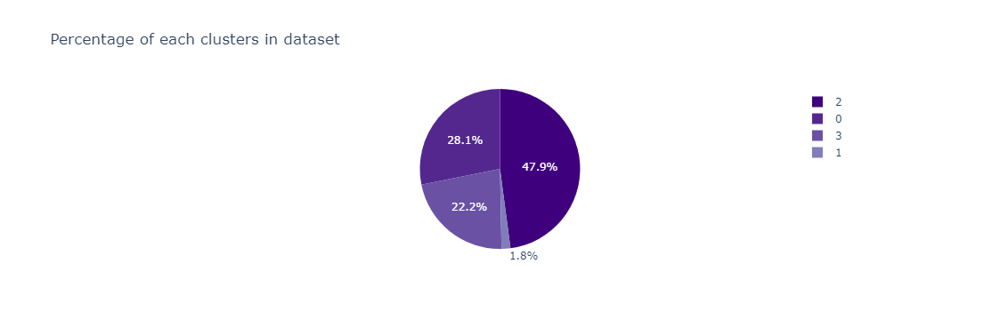

In [77]:
df_count =pd.DataFrame({'Cluster Column Name:':df_pca_copy['KMeans_pred'].value_counts().index,'Cluster Count:':df_pca_copy['KMeans_pred'].value_counts().values})
plt =px.pie(df_count,values='Cluster Count:', names='Cluster Column Name:', title="Percentage of each clusters in dataset",color_discrete_sequence =px.colors.sequential.Purples_r)
plt.show()

$Interpretation$
the data is more in cluster index = 2 total values 80 around 47.9%.

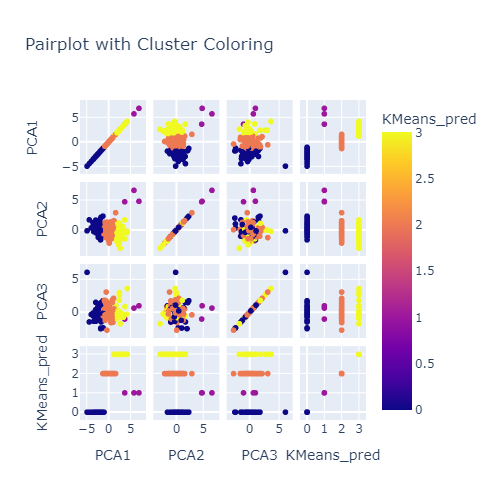

In [ ]:

# sns.pairplot(df_pca_copy[df_pca_copy.columns],hue='KMeans_pred',corner=True,diag_kind="kde")
# Create scatter plots for each pair of features, coloring by cluster label
fig = px.scatter_matrix(df_pca_copy,
                        dimensions=['PCA1', 'PCA2', 'PCA3', 'KMeans_pred'],
                        color='KMeans_pred',
                        title='Pairplot with Cluster Coloring')
# Set the figure size
fig.update_layout(
    width=800,  # Width in pixels
    height=500)  # Height in pixels
# Show the plot
fig.show()

# 2.Mini Batch KMeans
Mini Batch KMeans is an optimization of the traditional KMeans clustering algorithm that aims to improve its efficiency, especially when dealing with large datasets.

Here's how the Mini Batch KMeans algorithm works:

Initialization: Initialize K cluster centroids randomly from the data points.

Mini-Batch Sampling: Instead of using the entire dataset in each iteration, Mini Batch KMeans randomly samples a small portion (mini-batch) of the data. This significantly speeds up the algorithm, as it reduces the computation required for each iteration. The mini-batch size is typically much smaller than the total number of data points.

Assignment: For each data point in the mini-batch, find the nearest centroid (cluster center) using a distance metric such as Euclidean distance. Assign the data point to the cluster associated with the nearest centroid.
Partial Update of Centroids: After processing the mini-batch, update the centroids of the clusters based on the data points that were assigned to them. Instead of recomputing the centroids using all data points in the cluster, Mini Batch KMeans updates the centroids incrementally using only the newly assigned data points. This step helps the algorithm adapt to changes in the data distribution.
Convergence Check: Check if the centroids have converged (i.e., their positions do not change significantly). If not converged, repeat steps 2 to 4 for a certain number of iterations or until convergence criteria are met.
Final Assignment: After the algorithm has converged or reached the specified number of iterations, assign all data points to their nearest centroids using the final centroid positions.
Mini Batch KMeans offers a trade-off between the convergence speed and the quality of the clustering compared to the traditional KMeans algorithm. It can converge faster than the regular KMeans because it processes smaller mini-batches of data, but the quality of the clusters might not be as high due to the random sampling of data points. However, for large datasets where traditional KMeans might be too slow, Mini Batch KMeans can be a very efficient alternative.

In [190]:
mini_batches =[]
for k in range(1,11):
    minikmeans =MiniBatchKMeans(n_clusters=k,random_state=42)
    minikmeans.fit(df_pca)
    mini_batches.append(minikmeans.inertia_)

In [194]:
k2= KneeLocator(range(1,11),mini_batches,curve='convex',direction='decreasing')
k2.elbow

4

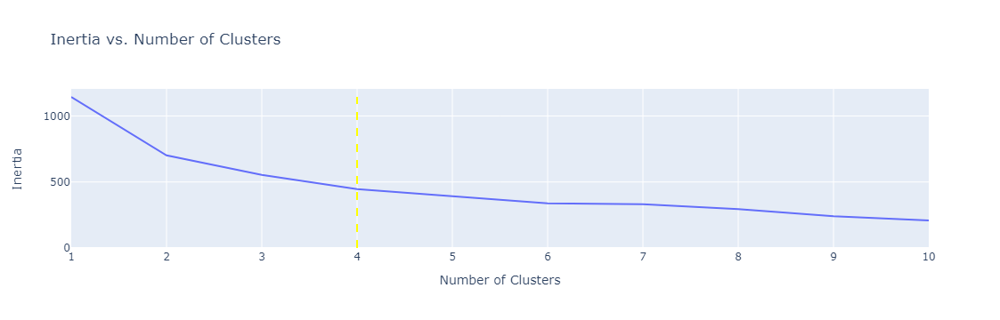

In [195]:
# Create a DataFrame for the K values and inertia
inertia_df = pd.DataFrame({'Number of Clusters (K)': range(1,11), 'Inertia': mini_batches})

# Determine the elbow point (k2.elbow) - Replace with the actual elbow point you have
k_elbow = 4

# Create the inertia plot using Plotly Express
fig = px.line(inertia_df, x='Number of Clusters (K)', y='Inertia', title='Inertia vs. Number of Clusters')
fig.update_xaxes(title='Number of Clusters')
fig.update_yaxes(title='Inertia')

# Add a vertical line at the determined elbow point
fig.add_shape(
    dict(type='line', x0=k_elbow, x1=k_elbow, y0=0, y1=inertia_df['Inertia'].max(), line=dict(color='yellow', dash='dash'), name='Elbow Point')
)

# Show the plot
fig.show()





# Lets again find silhouette Score, calinski_harabasz score and davis bouldin score for ,mini batches KMeans clustering

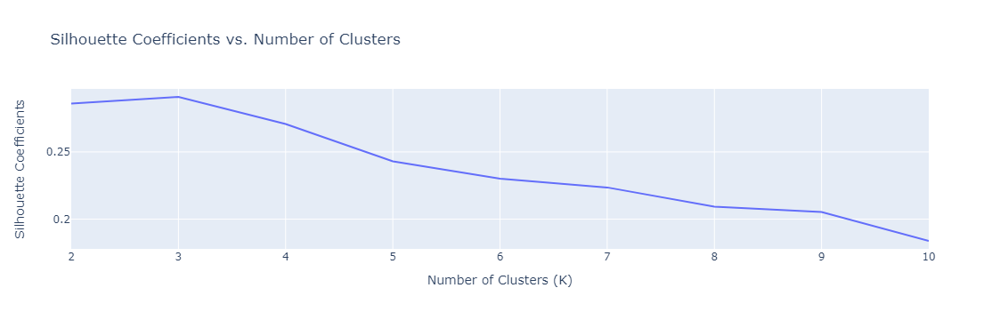

In [197]:
silhouette_coefficients =[]
for k in range (2,11):
    mkmeans=MiniBatchKMeans(n_clusters=k,random_state=42)
    mkmeans.fit(df_pca)
    score =silhouette_score(scaled_dataframe,mkmeans.labels_)
    silhouette_coefficients.append(score)

# Create a DataFrame for the K values and silhouette coefficients
silhouette_df1 = pd.DataFrame({'Number of Clusters (K)': range(2,11), 'Silhouette Coefficients': silhouette_coefficients})

# Create the silhouette coefficients plot using Plotly Express
fig = px.line(silhouette_df1, x='Number of Clusters (K)', y='Silhouette Coefficients', 
              title='Silhouette Coefficients vs. Number of Clusters')
fig.update_xaxes(title='Number of Clusters (K)')
fig.update_yaxes(title='Silhouette Coefficients')

# Show the plot
fig.show()

    
    
    

    
    
    

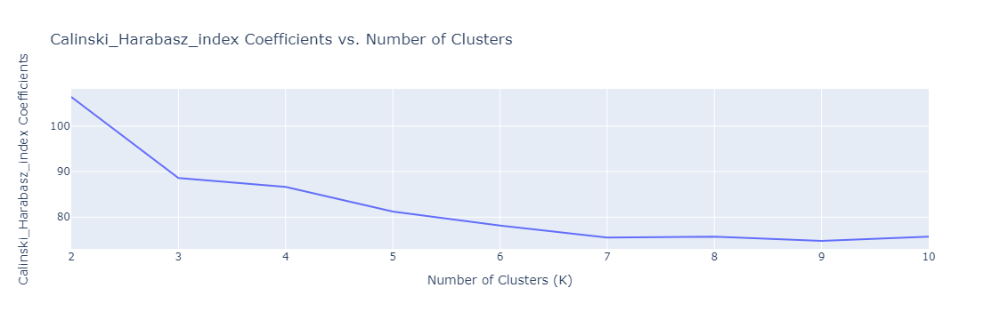

In [198]:
calinski_harabasz =[]

for k in range(2,11):
    mbkmeans= MiniBatchKMeans(n_clusters =k,random_state=42)
    mbkmeans.fit(df_pca)
    score =calinski_harabasz_score(df_pca, mbkmeans.labels_)
    calinski_harabasz.append(score)

# Create a DataFrame for the K values and calinski_Harabasz_index
calinski_Harabasz_df = pd.DataFrame({'Number of Clusters (K)': range(2,11), 'calinski_Harabasz_index': calinski_Harabasz_index})

# Create the silhouette coefficients plot using Plotly Express
fig = px.line(calinski_Harabasz_df, x='Number of Clusters (K)', y='calinski_Harabasz_index', 
              title='Calinski_Harabasz_index Coefficients vs. Number of Clusters')
fig.update_xaxes(title='Number of Clusters (K)')
fig.update_yaxes(title='Calinski_Harabasz_index Coefficients')

# Show the plot
fig.show()


# According to the results, we consider the number of clusters equal to three.
# Prediction2


In [84]:

mbkmeans = MiniBatchKMeans(n_clusters=4, random_state=42)         
mbkmeans.fit(df_pca)
pred2 =mbkmeans.labels_
centroids=mbkmeans.cluster_centers_
centroid_df=pd.DataFrame(centroids,columns=df_pca.columns)
centroid_df.T


,0,1,2,3
PCA1,-2.270877,2.515562,0.311286,5.335088
PCA2,0.352648,-0.566936,-0.260373,5.414818
PCA3,-0.060198,0.130670,-0.008598,0.159125


In [85]:
df_pca_copy['MiniBatchPred']=pred2
df_pca_copy

,PCA1,PCA2,PCA3,KMeans_pred,MiniBatchPred
0,-2.913025,0.095621,-0.718118,0,0
1,0.429911,-0.588156,-0.333486,2,2
2,-0.285225,-0.455174,1.221505,2,2
3,-2.932423,1.695555,1.525044,0,0
4,1.033576,0.136659,-0.225721,2,2
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,2,2
163,-0.551036,-1.233886,3.101350,2,2
164,0.498524,1.390744,-0.238526,2,2
165,-1.887451,-0.109453,1.109752,0,0


# Performance2 using KMeans bu MINI Batches

In [86]:

m_silhouetteScore,m_calinskiScore,m_dunnIndex= performance(df_pca,mbkmeans.labels_)

print('mb_silhoutteScore', m_silhouetteScore)
print('mb_calinskiScore', m_calinskiScore)
print('mb_dunnIndex', m_dunnIndex)

mb_silhoutteScore 0.30081776305873903
mb_calinskiScore 85.89408751365316
mb_dunnIndex 1.0073590983761684


# Visualization:

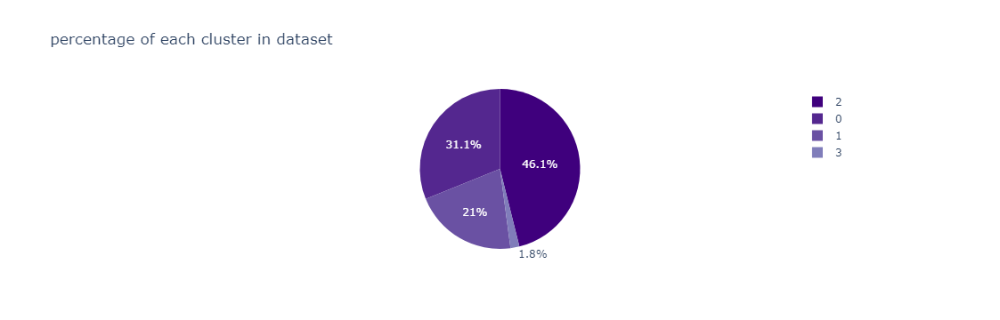

In [87]:
df_count =pd.DataFrame({'cluster':df_pca_copy['MiniBatchPred'].value_counts().index,'Count':df_pca_copy['MiniBatchPred'].value_counts().values})
plt=px.pie(df_count,values="Count",names="cluster",title='percentage of each cluster in dataset',color_discrete_sequence=px.colors.sequential.Purples_r)
plt.show()

$Interpretations:$ cluster index=2, counts=77 datasets, approximately 47%

# 3.Gaussian Mixture Model (GMM).

A Gaussian Mixture Model (GMM) is a probabilistic model used for modeling data that can be thought of as a mixture of several Gaussian (normal) distributions. GMMs are particularly useful for tasks like clustering, density estimation, and data generation.

how a Gaussian Mixture Model works:

Initialization: The first step in using a GMM is to initialize the model. This typically involves selecting the number of components (Gaussians) in the mixture and initializing their parameters. The parameters include the means, variances (or covariances), and the mixing coefficients (weights) for each Gaussian component. These parameters can be initialized randomly or using some other heuristic.

Expectation-Maximization (EM) Algorithm:

Expectation (E-step): In this step, for each data point, you calculate the probability that it belongs to each of the Gaussian components. This is done using Bayes' theorem and is known as the responsibility or posterior probability. Essentially, you compute how likely each component is responsible for generating each data point.

Maximization (M-step): In this step, you update the parameters (mean, variance, and mixing coefficients) of each Gaussian component based on the responsibilities calculated in the E-step. This step involves maximizing the likelihood of the data under the current model. The formulas for updating these parameters can be derived using maximum likelihood estimation.

Iteration: Steps 2 (E-step and M-step) are repeated iteratively until convergence criteria are met. Common convergence criteria include a maximum number of iterations, a small change in likelihood, or a small change in the model parameters.

Final Model: Once the GMM has converged, you have a final model with parameters that best represent the underlying data distribution as a mixture of Gaussian components.

Using the GMM:

Clustering: You can use the GMM to assign each data point to one of the Gaussian components based on the highest responsibility. This can be used for clustering the data. Density Estimation: GMMs can be used to estimate the probability density function of the data. This can be useful for anomaly detection and generating new data points that follow a similar distribution. Data Generation: Once trained, you can generate new data points from the GMM. To do this, you sample from the mixing coefficients to choose a component and then sample from the chosen Gaussian component to generate a data point.

In [88]:
#Grid Search Metho is used to find the best estimator for our model prediction:

#  lets define the parameter grid
param_grid = {'n_components':range(2,11),'covariance_type':['full','tied','diag','spherical']
              ,'init_params':['kmeans','random']  }                           
# Try different values for the number of components
# Different covariance types to try
# Different initialization methods to try
gmm =GaussianMixture(random_state=42)
# Perform grid search with cross-validation
grid_search = GridSearchCV(gmm, param_grid, cv=5, n_jobs=-1)
grid_search.fit(df_pca) 

# Get the best model and its parameters
best_gmm = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best Parameters:", best_params)

Best Parameters: {'covariance_type': 'diag', 'init_params': 'random', 'n_components': 4}


In [89]:
silhouette_coefficients = []
for n in range(2,11) : 
    gmm =GaussianMixture(n_components=n,random_state=42,covariance_type='diag',init_params='random')
    gmm.fit(df_pca)
    score= silhouette_score(df_pca,gmm.predict(df_pca))
    silhouette_coefficients.append(score)

In [90]:
calinski_harabasz_coef = []
for n in range(2,11):
    gmm =GaussianMixture(n_components =n,random_state=42, covariance_type='diag',init_params='random')
    gmm.fit(df_pca)
    score= calinski_harabasz_score(df_pca,gmm.predict(df_pca))
    calinski_harabasz_coef.append(score)

In [91]:
#The best value of n_components using this method is equal to 4.
# According to the results, we consider the number of component equal to 4.

#Prediction3
gmm =GaussianMixture(n_components=4,random_state=42,covariance_type='diag',init_params='random')
gmm.fit(df_pca)
print('means',gmm.means_)
print()
print('covariances:',gmm.covariances_)

print()
print('weights',gmm.weights_)

print()
pred3= gmm.predict(df_pca)
# Cluster means
# Covariance matrices
  # Mixing coefficients
 # Assign data points to clusters


means [[-1.25595037 -0.01467402  0.02129659]
 [-0.30704544  0.31960197  0.61209002]
 [ 1.33320627 -0.40162511 -0.36303991]
 [ 4.44120111  2.82323228 -0.10049974]]

covariances: [[ 1.89869912  0.58152737  0.59153205]
 [ 4.63856275  1.11218598  3.72339562]
 [ 1.25535038  1.14468353  0.0948062 ]
 [ 2.97331097 12.5520192   1.144059  ]]

weights [0.42582312 0.19652481 0.34815825 0.02949382]



In [92]:
df_pca_copy['GMM_pred'] = pred3
df_pca_copy

,PCA1,PCA2,PCA3,KMeans_pred,MiniBatchPred,GMM_pred
0,-2.913025,0.095621,-0.718118,0,0,0
1,0.429911,-0.588156,-0.333486,2,2,2
2,-0.285225,-0.455174,1.221505,2,2,0
3,-2.932423,1.695555,1.525044,0,0,1
4,1.033576,0.136659,-0.225721,2,2,2
...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,2,2,0
163,-0.551036,-1.233886,3.101350,2,2,1
164,0.498524,1.390744,-0.238526,2,2,2
165,-1.887451,-0.109453,1.109752,0,0,0


# Performance3

In [93]:

gmm_silhoutteScore, gmm_calinskiScore, gmm_dunnIndex = performance(df_pca, pred3)
print('gmm_silhoutteScore', gmm_silhoutteScore)
print('gmm_calinskiScore', gmm_calinskiScore)
print('gmm_dunnIndex', gmm_dunnIndex)

gmm_silhoutteScore 0.25838426198822806
gmm_calinskiScore 37.53077040682732
gmm_dunnIndex 2.0771364978783273


# Visualization3

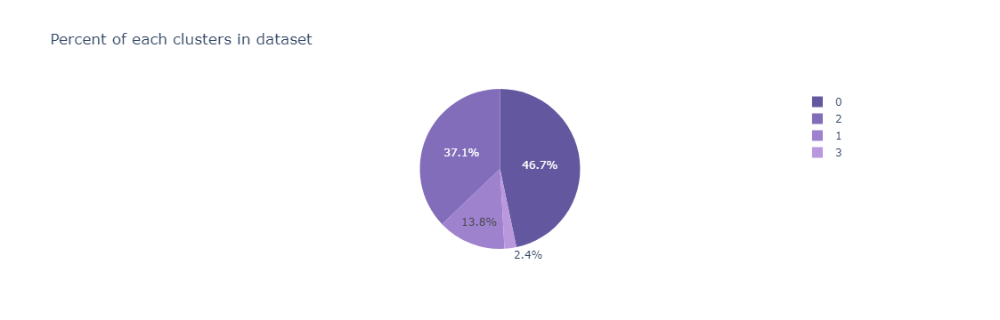

In [94]:


df_count = pd.DataFrame({'Cluster':df_pca_copy['GMM_pred'].value_counts().index, 'Count':df_pca_copy['GMM_pred'].value_counts().values})
plt = px.pie(df_count, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

$Interpretation:$ cluster index =0 has 46.7% od datapoint around 78.

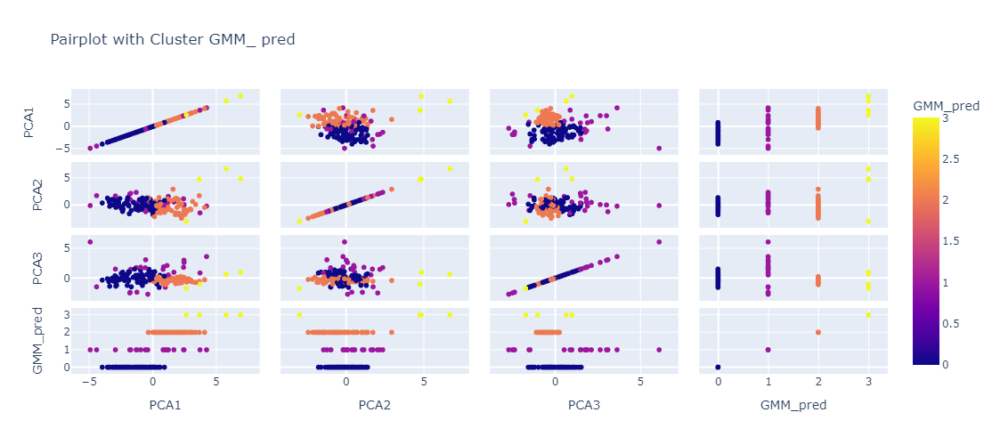

In [208]:
#sns.pairplot(df_pca_copy[df_pca_copy.drop(columns=['KMeans_pred', 'MiniBatchPred'], axis=1).columns], hue='GMM_pred', corner=True, diag_kind="hist")



# Create scatter plots for each pair of features, coloring by cluster label
fig = px.scatter_matrix(df_pca_copy,
                        dimensions=['PCA1', 'PCA2', 'PCA3', 'GMM_pred'],
                        color='GMM_pred',
                        title='Pairplot with Cluster GMM_ pred ')
# Set the figure size
fig.update_layout(
    width=800,  # Width in pixels
    height=500)  # Height in pixels
# Show the plot
fig.show()
# Customize the subplot axes and add histograms to the diagonal
#fig.update_traces(diagonal_visible=True)
#fig.update_layout(diagonal_type='histogram')





# 4.DBSCAN

It is particularly effective in identifying clusters of data points in a dataset based on their density. DBSCAN does not require specifying the number of clusters beforehand, making it a versatile and useful technique.

Here's how DBSCAN works:

Density-based clustering: DBSCAN operates by identifying "dense" regions in the data space and groups data points that are close to each other into clusters. It defines two important parameters:

a. Epsilon (ε): This is the radius that defines the neighborhood around each data point. It is used to determine which points are considered neighbors of each other.

b. MinPts: This is the minimum number of points required to form a dense region (cluster). If a data point has at least MinPts neighbors within a distance of ε, then it is considered a core point.

Core points: DBSCAN starts by randomly selecting a data point in the dataset. It then checks whether this point has at least MinPts neighboring data points within a distance of ε. If it does, the point is marked as a core point and forms the basis of a new cluster.

Expanding the cluster: Once a core point is identified, DBSCAN expands the cluster by finding all its neighbors within the ε distance. If a neighbor is also a core point, its neighbors are examined, and this process continues, creating a cluster of connected core points.

Border points: If a data point does not have enough neighbors to be a core point but falls within the ε distance of another core point, it is considered a border point. Border points do not create new clusters but are assigned to the cluster of the core point they are close to.

Noise points:Any data point that does not belong to any cluster and is not a border point is considered a noise point. These points are usually outliers in the dataset.

The DBSCAN algorithm continues this process of finding core points, expanding clusters, and assigning border and noise points until all data points are examined. The result is a set of clusters, each formed by densely connected data points, and some data points labeled as noise.

DBSCAN has some key advantages, such as its ability to handle clusters of different shapes and sizes, robustness to noise, and not requiring a predefined number of clusters. However, it may struggle with datasets of varying densities, and the parameter tuning for ε and MinPts can sometimes be challenging.

In [96]:
# Finding the optimal parameters (ε(epsilon) and MinPts):

# Generate 20 equally spaced values between 0.1 and 2.0 (inclusive).
eps_values =np.linspace(0.1,2.0,20)
# Range of values for the minimum number of samples.
min_samples_values =range(3,10)
# Initialize variables to store the best hyperparameters and score.
best_eps= None
best_min_sample=None
best_score=-1
# Loop over different values of epsilon and min_samples.
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan =DBSCAN(eps=eps,min_samples= min_samples)
        # fit the model to the data
        dbscan.fit(df_pca)
        labels =dbscan.labels_
        if len(np.unique(labels))>1:
            score = silhouette_score(df_pca,labels)
            if score>best_score:
                best_score =score
                best_eps =eps
                best_min_samples =min_samples
print(f"Optimal Epsilon: {best_eps}")
print(f"Optimal MinPts: {best_min_samples}")

Optimal Epsilon: 2.0
Optimal MinPts: 3


# Prediction4

In [97]:
dbscan =DBSCAN(eps=best_eps,min_samples =best_min_samples)
dbscan.fit(df_pca)
pred4=dbscan.labels_

In [98]:
pred4

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0])

In [99]:
df_pca_copy['DBSCAN_Pred'] =pred4
df_pca_copy

,PCA1,PCA2,PCA3,KMeans_pred,MiniBatchPred,GMM_pred,DBSCAN_Pred
0,-2.913025,0.095621,-0.718118,0,0,0,0
1,0.429911,-0.588156,-0.333486,2,2,2,0
2,-0.285225,-0.455174,1.221505,2,2,0,0
3,-2.932423,1.695555,1.525044,0,0,1,0
4,1.033576,0.136659,-0.225721,2,2,2,0
...,...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,2,2,0,0
163,-0.551036,-1.233886,3.101350,2,2,1,0
164,0.498524,1.390744,-0.238526,2,2,2,0
165,-1.887451,-0.109453,1.109752,0,0,0,0


# Performance

In [100]:

db_silhoutteScore, db_calinskiScore, db_dunnIndex = performance(df_pca, dbscan.labels_)
print('db_silhoutteScore', db_silhoutteScore)
print('db_calinskiScore', db_calinskiScore)
print('db_dunnIndex', db_dunnIndex)

db_silhoutteScore 0.6178129161645172
db_calinskiScore 18.00493528371053
db_dunnIndex 1.3695431201037485


# Visualization

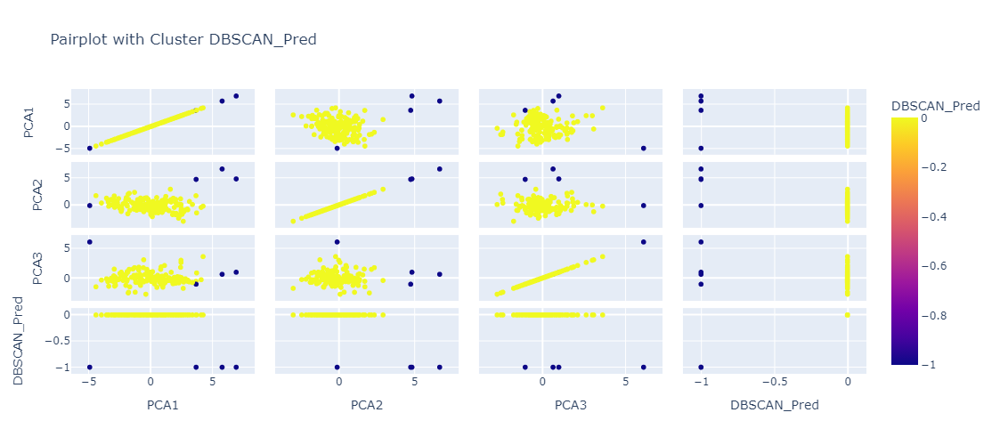

In [210]:

# Create scatter plots for each pair of features, coloring by cluster label
fig = px.scatter_matrix(df_pca_copy,
                        dimensions=['PCA1', 'PCA2', 'PCA3', 'DBSCAN_Pred'],
                        color='DBSCAN_Pred',
                        title='Pairplot with Cluster DBSCAN_Pred ')
# Set the figure size
fig.update_layout(
    width=800,  # Width in pixels
    height=500)  # Height in pixels
# Show the plot
fig.show()
# Customize the subplot axes and add histograms to the diagonal
#fig.update_traces(diagonal_visible=True)
#fig.update_layout(diagonal_type='histogram')



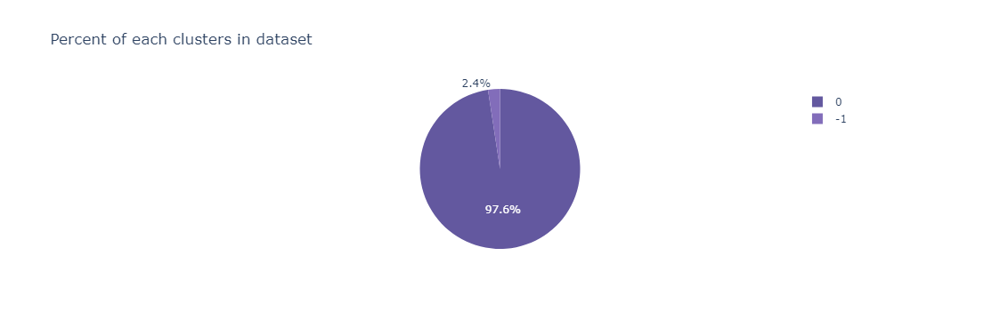

In [101]:


df_count = pd.DataFrame({'Cluster':df_pca_copy['DBSCAN_Pred'].value_counts().index, 'Count':df_pca_copy['DBSCAN_Pred'].value_counts().values})
plt = px.pie(df_count, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

# 5.Hierarchical

There are two main types of hierarchical clustering: agglomerative and divisive. I'll explain the agglomerative approach, which is more commonly used:

Agglomerative Hierarchical Clustering:

Initialization: Each data point starts as its own individual cluster.

Similarity Calculation: The algorithm calculates the similarity or dissimilarity between each pair of data points. Common distance metrics such as Euclidean distance or cosine similarity are often used.

Merge Closest Clusters: The two closest clusters based on the chosen similarity metric are merged to form a new, larger cluster. The distance between clusters is determined by the linkage criterion. There are different linkage criteria used, including single linkage, complete linkage, and average linkage, among others.

Single Linkage: The distance between two clusters is defined by the shortest distance between any two points in the two clusters.

Complete Linkage: The distance between two clusters is defined by the longest distance between any two points in the two clusters.

Average Linkage: The distance between two clusters is defined by the average distance between all pairs of points in the two clusters.

Update Similarity Matrix: After merging clusters, the similarity matrix is updated to reflect the distances between the new cluster and the remaining individual clusters.
Repeat: Steps 3 and 4 are repeated until all data points belong to a single cluster or a predefined number of clusters is reached.

Dendrogram: During the process, a dendrogram is created, which is a tree-like structure that visually represents the hierarchical clustering process. The height at which two clusters are merged in the dendrogram represents their distance or dissimilarity.

Cluster Selection: The desired number of clusters is chosen by cutting the dendrogram at a specific height or by using another method, such as the Elbow method or Silhouette analysis, to determine the optimal number of clusters.

Hierarchical clustering is flexible and does not require specifying the number of clusters beforehand, making it useful for exploratory data analysis. However, it can be computationally expensive for large datasets, and the choice of linkage criteria can significantly impact the final clustering result.

# Prediction5

In [102]:
hierarchical_cluster =AgglomerativeClustering(n_clusters=4, linkage='average')
hierarchical_cluster.fit(df_pca)

AgglomerativeClustering(linkage='average', n_clusters=4)

In [103]:
# Store result of Agglomerative
pred5 =hierarchical_cluster.labels_
df_pca_copy['Hierarchical_Pred']=pred5
df_pca_copy

,PCA1,PCA2,PCA3,KMeans_pred,MiniBatchPred,GMM_pred,DBSCAN_Pred,Hierarchical_Pred
0,-2.913025,0.095621,-0.718118,0,0,0,0,2
1,0.429911,-0.588156,-0.333486,2,2,2,0,2
2,-0.285225,-0.455174,1.221505,2,2,0,0,2
3,-2.932423,1.695555,1.525044,0,0,1,0,2
4,1.033576,0.136659,-0.225721,2,2,2,0,2
...,...,...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,2,2,0,0,2
163,-0.551036,-1.233886,3.101350,2,2,1,0,2
164,0.498524,1.390744,-0.238526,2,2,2,0,2
165,-1.887451,-0.109453,1.109752,0,0,0,0,2


# Performance5


In [104]:

h_silhoutteScore, h_calinskiScore, h_dunnIndex = performance(df_pca, hierarchical_cluster.labels_)
print('h_silhoutteScore', h_silhoutteScore)
print('h_calinskiScore', h_calinskiScore)
print('h_dunnIndex', h_dunnIndex)

h_silhoutteScore 0.4480846132861334
h_calinskiScore 16.84931474381742
h_dunnIndex 0.49983954626178956


# Visualization5:

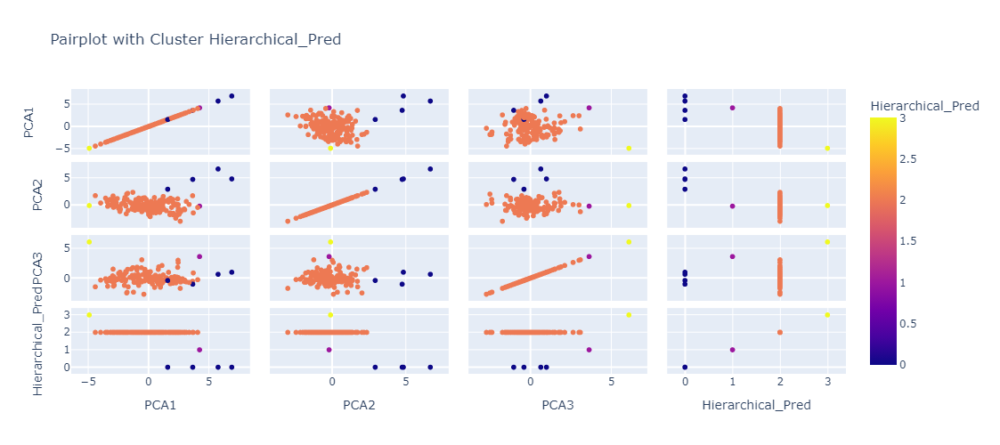

In [211]:
# Create scatter plots for each pair of features, coloring by cluster label
fig = px.scatter_matrix(df_pca_copy,
                        dimensions=['PCA1', 'PCA2', 'PCA3', 'Hierarchical_Pred'],
                        color='Hierarchical_Pred',
                        title='Pairplot with Cluster Hierarchical_Pred ')
# Set the figure size
fig.update_layout(
    width=800,  # Width in pixels
    height=500)  # Height in pixels
# Show the plot
fig.show()
# Customize the subplot axes and add histograms to the diagonal
#fig.update_traces(diagonal_visible=True)
#fig.update_layout(diagonal_type='histogram')



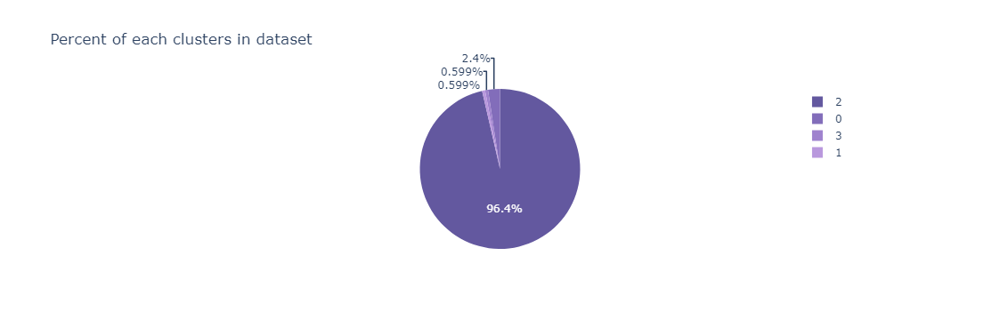

In [105]:
#Visualization5

df_count = pd.DataFrame({'Cluster':df_pca_copy['Hierarchical_Pred'].value_counts().index, 'Count':df_pca_copy['Hierarchical_Pred'].value_counts().values})
plt = px.pie(df_count, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

# Compare models

# Without removing outliers:

In [107]:
info1 = pd.DataFrame({'Model':['KMeans', 'Mini Batch KMeans', 'Gaussian Mixture Model (GMM)', 'DBSCAN', 'Hierarchical'],
                        'silhouette_score':[km_silhouetteScore, m_silhouetteScore, gmm_silhoutteScore, db_silhoutteScore, h_silhoutteScore],
                        'calinski_harabasz_score':[km_calinskiScore, m_calinskiScore, gmm_calinskiScore, db_calinskiScore, h_calinskiScore],
                        'davies_bouldin_score':[km_dunneIndex, m_dunnIndex, gmm_dunnIndex, db_dunnIndex, h_dunnIndex]})
info1.style.highlight_max(color="yellow")



,Model,silhouette_score,calinski_harabasz_score,davies_bouldin_score
0,KMeans,0.301531,86.365924,0.993605
1,Mini Batch KMeans,0.300818,85.894088,1.007359
2,Gaussian Mixture Model (GMM),0.258384,37.530770,2.077136
3,DBSCAN,0.617813,18.004935,1.369543
4,Hierarchical,0.448085,16.849315,0.499840


$ Interpretation:$ we can see that mini batches has more effectively for this datasets.

# Model Prediction including With Outliers:

# KMeans_Cluster

In [108]:
inertia_1=[]
k_rng = range(1,11)
for k in k_rng:
    km = KMeans(n_clusters=k, **KMeans_dict)
    km.fit(df_pca2)
    inertia_1.append(km.inertia_)


In [110]:
k = KneeLocator(range(1,11),inertia_1, curve="convex",direction='decreasing')
print('Optimal Number of Clusters:',k.elbow)

Optimal Number of Clusters: 4


In [112]:
# Sihouette score for Kmeans
silhouette_coeff=[]
for k in range(2,11):
    kmeans= KMeans(n_clusters=k,**KMeans_dict)
    kmeans.fit(df_pca2)
    score_1 =silhouette_score(df_pca2,kmeans.labels_)
    silhouette_coeff.append(score_1)

In [114]:
calinski_Harabasz_index=[]
for k in range(2,11):
    kmeans=KMeans(n_clusters=k, **KMeans_dict)
    kmeans.fit(df_pca2)
    score_1= calinski_harabasz_score(df_pca2,kmeans.labels_)
    calinski_Harabasz_index.append(score_1)

In [116]:
kmeans.labels_

array([9, 5, 1, 6, 5, 1, 1, 8, 8, 1, 5, 2, 1, 5, 3, 4, 3, 9, 3, 1, 5, 3,
       1, 2, 5, 9, 9, 3, 9, 8, 3, 9, 9, 5, 1, 1, 9, 9, 6, 5, 9, 5, 5, 7,
       8, 1, 1, 1, 5, 6, 9, 7, 3, 8, 8, 6, 9, 5, 8, 9, 8, 5, 1, 9, 9, 3,
       7, 8, 1, 1, 1, 1, 4, 5, 8, 3, 8, 3, 1, 9, 0, 2, 3, 6, 5, 5, 0, 0,
       2, 7, 5, 9, 9, 7, 7, 9, 6, 3, 0, 3, 6, 5, 3, 9, 1, 3, 1, 4, 8, 2,
       9, 7, 3, 1, 1, 5, 8, 5, 1, 9, 3, 2, 9, 5, 7, 9, 7, 4, 0, 9, 5, 8,
       1, 3, 9, 3, 8, 4, 9, 9, 7, 9, 0, 3, 3, 1, 3, 9, 3, 2, 8, 5, 1, 3,
       1, 7, 6, 9], dtype=int32)

In [117]:
kmeans =KMeans(n_clusters =4,**KMeans_dict)
kmeans.fit(df_pca2)
pred_1 =kmeans.labels_
centroids =kmeans.cluster_centers_
centroidDF =pd.DataFrame(centroids, columns =df_pca2.columns)
centroidDF

,PC1,PC2,PC3
0,-0.285227,-1.018594,0.821220
1,2.690647,-0.500762,-0.471336
2,0.369909,1.136546,0.132091
3,-2.667760,0.017380,-0.532336


In [118]:
df_pca2_copy =df_pca2.copy()
df_pca2_copy['KMeans_pred_outliers']=pred_1
df_pca2_copy

,PC1,PC2,PC3,KMeans_pred_outliers
0,-3.157346,-0.186172,-1.142797,3
1,0.523170,-0.163654,-0.227992,2
2,-0.276443,-0.832019,1.486766,0
3,-3.267228,0.767681,2.026595,3
4,1.233904,0.649348,0.024260,2
...,...,...,...,...
153,-0.870380,0.984045,-0.023983,2
154,-0.673632,-2.581426,3.377453,0
155,0.425853,2.248373,0.774712,2
156,-2.107043,-0.767815,1.247374,0


In [119]:
def performance_test(df,labels):
    silhouetteScore=silhouette_score(df,labels)
    CalinskiHarabaszScore =calinski_harabasz_score(df,labels)
    DunnIndex =davies_bouldin_score(df, labels)
    return silhouetteScore,CalinskiHarabaszScore, DunnIndex
silhouettescore_km,calinskiharabaszscore_km,dunnindex_km =performance_test(df_pca2,kmeans.labels_)
print('Kmeans silhouetteScore:',silhouettescore_km)
print('kmeans calinskiScore:',calinskiharabaszscore_km)
print('kmeans dunneIndex:',dunnindex_km)


Kmeans silhouetteScore: 0.30841330791761284
kmeans calinskiScore: 86.63588562344768
kmeans dunneIndex: 1.0776659668556132


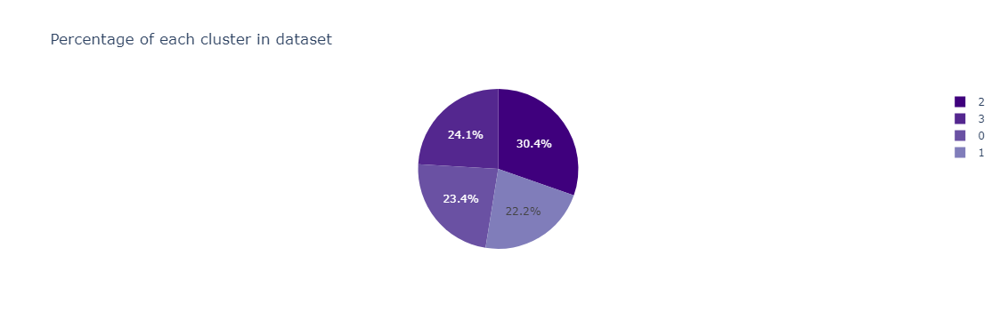

In [120]:
df_count =pd.DataFrame({"Cluster Column Number:":df_pca2_copy['KMeans_pred_outliers'].value_counts().index,'Cluster Count:':df_pca2_copy["KMeans_pred_outliers"].value_counts().values})
plt =px.pie(df_count,values='Cluster Count:', names="Cluster Column Number:",title="Percentage of each cluster in dataset",color_discrete_sequence =px.colors.sequential.Purples_r)
plt.show()

$Interpretation:$  with outliers  the distribution of the cluster is evenly regardless he cluster index =2 has more number of data points.

# Mini Batch KMeans Clustering for Outliers.

In [121]:
mini_batches=[]
for k in range(1,11):
    minikmeans =MiniBatchKMeans(n_clusters =k ,random_state =42)
    minikmeans.fit(df_pca2)
    mini_batches.append(minikmeans.inertia_)

In [122]:
k_2 =KneeLocator(range(1,11),mini_batches,curve='convex',direction='decreasing')
k_2.elbow

3

In [124]:
silhouette_coeff =[]
for k in range(2,11):
    minikmeans =MiniBatchKMeans(n_clusters=k,random_state =42)
    minikmeans.fit(df_pca2)
    score=silhouette_score(scaled_dataframe2, minikmeans.labels_)
    silhouette_coeff.append(score)

In [125]:
calinski_harabasz_coef=[]
for k in range(2,11):
    minicalinskikmeans =MiniBatchKMeans(n_clusters=k,random_state=42)
    minicalinskikmeans.fit(df_pca2)
    score=calinski_harabasz_score(df_pca2,minicalinskikmeans.labels_)
    calinski_harabasz_coef.append(score)

In [129]:
# find the centroid for mini batches kmeans:
mb_1kmeans =MiniBatchKMeans(n_clusters= 3,random_state=42)
mb_1kmeans.fit(df_pca2)
pred_2=mb_1kmeans.labels_
centroid =mb_1kmeans.cluster_centers_
centroid_1=pd.DataFrame(centroid,columns =df_pca2.columns)
centroid_1.T

,0,1,2
PC1,-2.775129,1.947091,-0.453264
PC2,0.039674,0.125916,-0.201888
PC3,-0.547179,-0.259933,0.553283


In [130]:
df_pca2_copy['MiniBatchPred_outliers']=pred_2
df_pca2_copy

,PC1,PC2,PC3,KMeans_pred_outliers,MiniBatchPred_outliers
0,-3.157346,-0.186172,-1.142797,3,0
1,0.523170,-0.163654,-0.227992,2,2
2,-0.276443,-0.832019,1.486766,0,2
3,-3.267228,0.767681,2.026595,3,0
4,1.233904,0.649348,0.024260,2,1
...,...,...,...,...,...
153,-0.870380,0.984045,-0.023983,2,2
154,-0.673632,-2.581426,3.377453,0,2
155,0.425853,2.248373,0.774712,2,2
156,-2.107043,-0.767815,1.247374,0,2


In [131]:
m_outliers_silhouettescore, m_outliers_calinskiharabaszscore, m_outliers_dunnindex=performance_test(df_pca2,mb_1kmeans.labels_)

In [132]:
print('mb_silhoutteScore', m_outliers_silhouettescore)
print('mb_calinskiScore', m_outliers_calinskiharabaszscore)
print('mb_dunnIndex',  m_outliers_dunnindex)

mb_silhoutteScore 0.2774425115399944
mb_calinskiScore 87.14721657229161
mb_dunnIndex 1.2301415682655656


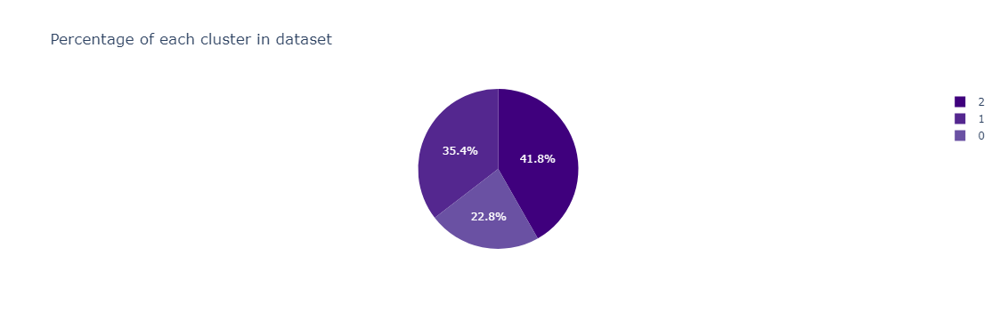

In [133]:
df_count1 =pd.DataFrame({'cluster:':df_pca2_copy['MiniBatchPred_outliers'].value_counts().index,'count:':df_pca2_copy['MiniBatchPred_outliers'].value_counts().values})
plt =px.pie(df_count1, values='count:',names='cluster:',title="Percentage of each cluster in dataset", color_discrete_sequence =px.colors.sequential.Purples_r)
plt.show()

# Gaussian Mixture Model(GMM):

In [134]:
# Grid Search Mthod is used t find the best esitimator for our model:
param_grid={'n_components':range(2,11),'covariance_type':['full','tied','diag','spherical']
              ,'init_params':['kmeans','random']  }

In [135]:
gmm =GaussianMixture(random_state =42)

In [136]:
grid_search =GridSearchCV(gmm,param_grid,cv=5,n_jobs=-1)
grid_search.fit(df_pca2)
best_gmm =grid_search.best_estimator_
best_param =grid_search.best_params_
print("Best Parameters:",best_param)

Best Parameters: {'covariance_type': 'full', 'init_params': 'kmeans', 'n_components': 2}


In [137]:
silhouette_coef=[]
for n in range(2,11):
    gmm = GaussianMixture(covariance_type= 'full', init_params= 'kmeans', n_components=n, random_state=42)
    gmm.fit(df_pca2)
    score= silhouette_score(df_pca2, gmm.predict(df_pca2))
    silhouette_coeff.append(score)

In [138]:
calinski_harabasz_index=[]
for n in range(2,11):
    gmm=GaussianMixture(covariance_type='full',init_params='kmeans',n_components=n, random_state=42)
    gmm.fit(df_pca2)
    score= calinski_harabasz_score(df_pca2,gmm.predict(df_pca2))
    calinski_harabasz_index.append(score)

# Prediction 3

In [139]:
# n_components =2 using this method:
gmm= GaussianMixture(n_components=2,random_state=42,covariance_type='full',init_params='kmeans')
gmm.fit(df_pca2)
print('means',gmm.means_) # cluster means
print()
print('covariance',gmm.covariances_) # covariance matrics
print()
print('weights',gmm.weights_) #Mixig Coefficients
print()
pred_3=gmm.predict(df_pca2) # prediction

means [[-1.16518705 -0.09862937  0.13526663]
 [ 1.25846105  0.10652471 -0.14609481]]

covariance [[[ 2.78817684  0.06370212  1.12053113]
  [ 0.06370212  1.15258735 -0.56128371]
  [ 1.12053113 -0.56128371  1.75005608]]

 [[ 2.5895627  -0.32697994 -0.85614798]
  [-0.32697994  1.84749758  0.63618679]
  [-0.85614798  0.63618679  0.70507662]]]

weights [0.51924248 0.48075752]



In [140]:
df_pca2_copy['GMM_pred_outliers'] = pred_3
df_pca2_copy

,PC1,PC2,PC3,KMeans_pred_outliers,MiniBatchPred_outliers,GMM_pred_outliers
0,-3.157346,-0.186172,-1.142797,3,0,0
1,0.523170,-0.163654,-0.227992,2,2,1
2,-0.276443,-0.832019,1.486766,0,2,0
3,-3.267228,0.767681,2.026595,3,0,1
4,1.233904,0.649348,0.024260,2,1,1
...,...,...,...,...,...,...
153,-0.870380,0.984045,-0.023983,2,2,0
154,-0.673632,-2.581426,3.377453,0,2,0
155,0.425853,2.248373,0.774712,2,2,1
156,-2.107043,-0.767815,1.247374,0,2,0


In [141]:
silhoutteScore_gmm, calinskiScore_gmm, dunnIndex_gmm = performance(df_pca, pred3)
print('gmm_silhoutteScore', silhoutteScore_gmm)
print('gmm_calinskiScore', calinskiScore_gmm)
print('gmm_dunnIndex', dunnIndex_gmm)

gmm_silhoutteScore 0.25838426198822806
gmm_calinskiScore 37.53077040682732
gmm_dunnIndex 2.0771364978783273


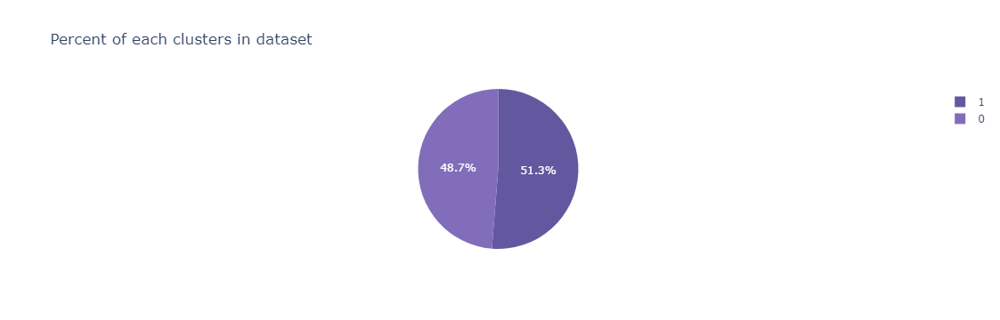

In [142]:
df_count = pd.DataFrame({'Cluster':df_pca2_copy['GMM_pred_outliers'].value_counts().index, 'Count':df_pca2_copy['GMM_pred_outliers'].value_counts().values})
plt = px.pie(df_count, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

# DBSCAN

In [144]:
# Finding the optimal parameters 
# lets make 20 spaces between 0.1to 2
eps_value =np.linspace(0.1,2.0,20)
min_samples_values =range(3,10)
best_eps= None
best_min_sample= None
best_score=-1
for eps in eps_value:
    for min_samples in min_samples_values:
        dbscan =DBSCAN(eps=eps,min_samples=min_samples)
        dbscan.fit(df_pca2)
        labels=dbscan.labels_
        if(len(np.unique(labels)))>1:
            score =silhouette_score(df_pca2,labels)
            if score >best_score:
                best_score =score
                best_eps=eps
                best_min_sample=min_samples
print(f"Optimal Epsilon:{best_eps}")
print(f"Optimal MinPoints:{best_min_samples}")


Optimal Epsilon:2.0
Optimal MinPoints:3


In [145]:
silhoutteScore_dbscan, calinskiScore_dbscan, dunnIndex_dbscan = performance(df_pca2, dbscan.labels_)
print('db_silhoutteScore', silhoutteScore_dbscan)
print('db_calinskiScore', calinskiScore_dbscan)
print('db_dunnIndex', dunnIndex_dbscan)

db_silhoutteScore 0.3263025100307972
db_calinskiScore 3.698696976630561
db_dunnIndex 2.3505969605042005


In [146]:
dbscan =DBSCAN(eps=best_eps,min_samples=best_min_samples)
dbscan.fit(df_pca2)
pred_4= dbscan.labels_

In [147]:
df_pca2_copy['DBSCAN_Pred_outliers'] =pred_4
df_pca2_copy

,PC1,PC2,PC3,KMeans_pred_outliers,MiniBatchPred_outliers,GMM_pred_outliers,DBSCAN_Pred_outliers
0,-3.157346,-0.186172,-1.142797,3,0,0,0
1,0.523170,-0.163654,-0.227992,2,2,1,0
2,-0.276443,-0.832019,1.486766,0,2,0,0
3,-3.267228,0.767681,2.026595,3,0,1,0
4,1.233904,0.649348,0.024260,2,1,1,0
...,...,...,...,...,...,...,...
153,-0.870380,0.984045,-0.023983,2,2,0,0
154,-0.673632,-2.581426,3.377453,0,2,0,0
155,0.425853,2.248373,0.774712,2,2,1,0
156,-2.107043,-0.767815,1.247374,0,2,0,0


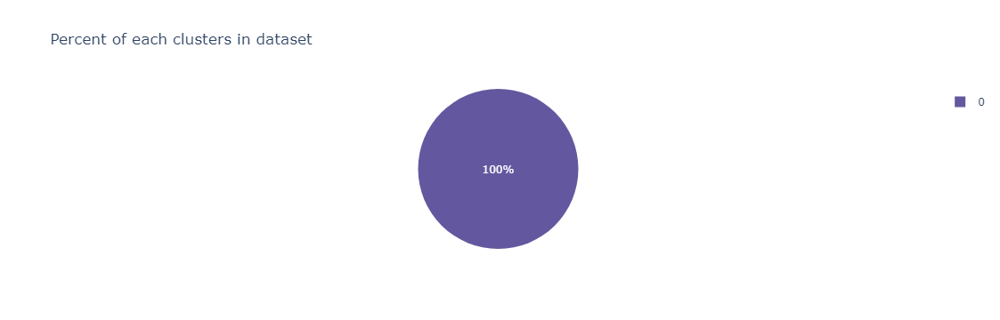

In [148]:
df_count2 = pd.DataFrame({'Cluster':df_pca2_copy['DBSCAN_Pred_outliers'].value_counts().index, 'Count':df_pca2_copy['DBSCAN_Pred_outliers'].value_counts().values})
plt = px.pie(df_count2, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

# 5 Hierarchical

In [149]:
hierarchical_cluster =AgglomerativeClustering(n_clusters=3,linkage='average')
hierarchical_cluster.fit(df_pca2)

AgglomerativeClustering(linkage='average', n_clusters=3)

In [150]:
pred_5= hierarchical_cluster.labels_
df_pca2_copy['Hierarchical_Pred_outliers']=pred_5
df_pca2_copy

,PC1,PC2,PC3,KMeans_pred_outliers,MiniBatchPred_outliers,GMM_pred_outliers,DBSCAN_Pred_outliers,Hierarchical_Pred_outliers
0,-3.157346,-0.186172,-1.142797,3,0,0,0,0
1,0.523170,-0.163654,-0.227992,2,2,1,0,0
2,-0.276443,-0.832019,1.486766,0,2,0,0,0
3,-3.267228,0.767681,2.026595,3,0,1,0,0
4,1.233904,0.649348,0.024260,2,1,1,0,0
...,...,...,...,...,...,...,...,...
153,-0.870380,0.984045,-0.023983,2,2,0,0,0
154,-0.673632,-2.581426,3.377453,0,2,0,0,2
155,0.425853,2.248373,0.774712,2,2,1,0,0
156,-2.107043,-0.767815,1.247374,0,2,0,0,0


In [151]:

silhoutteScore_h, calinskiScore_h, dunnIndex_h = performance_test(df_pca2, hierarchical_cluster.labels_)
print('h_silhoutteScore', silhoutteScore_h)
print('h_calinskiScore', calinskiScore_h)
print('h_dunnIndex', dunnIndex_h)

h_silhoutteScore 0.17494701330082515
h_calinskiScore 2.9369856407286625
h_dunnIndex 0.5354261153385258


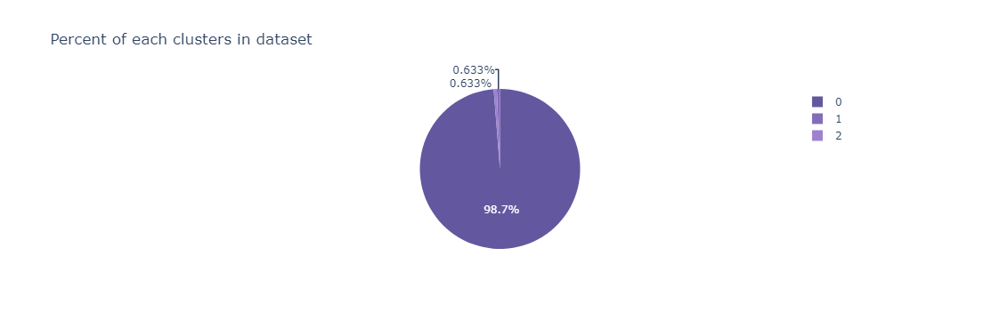

In [152]:
df_count = pd.DataFrame({'Cluster':df_pca2_copy['Hierarchical_Pred_outliers'].value_counts().index, 'Count':df_pca2_copy['Hierarchical_Pred_outliers'].value_counts().values})
plt = px.pie(df_count, values='Count', names='Cluster', title='Percent of each clusters in dataset', color_discrete_sequence=px.colors.sequential.Purp_r)
plt.show()

# Lets Make a table to understand  
#  a) without outliers

In [212]:
def scatterPlot(df, feature1, feature2, feature3, pred_column):
    # Create a subplot for each scatter plot (feature1 vs. feature2, feature1 vs. feature3, feature2 vs. feature3).
    fig = px.scatter(df, x=feature1, y=feature2, color=pred_column, title=f"{feature1} vs. {feature2}",
                     opacity=0.7, labels={feature1: feature1, feature2: feature2})

    fig2 = px.scatter(df, x=feature1, y=feature3, color=pred_column, title=f"{feature1} vs. {feature3}",
                      opacity=0.7, labels={feature1: feature1, feature3: feature3})

    fig3 = px.scatter(df, x=feature2, y=feature3, color=pred_column, title=f"{feature2} vs. {feature3}",
                      opacity=0.7, labels={feature2: feature2, feature3: feature3})

    # Adjust subplot layout for better spacing.
    fig.update_layout(width=800, height=400)
    fig2.update_layout(width=800, height=400)
    fig3.update_layout(width=800, height=400)

    # Display the plots.
    fig.show()
    fig2.show()
    fig3.show()

# Example usage:
# Replace 'df' and feature names with your actual data and feature names.
# scatterPlot(df, 'Feature1', 'Feature2', 'Feature3', 'pred_column')



In [155]:
df_pca_copy.columns

Index(['PCA1', 'PCA2', 'PCA3', 'KMeans_pred', 'MiniBatchPred', 'GMM_pred',
       'DBSCAN_Pred', 'Hierarchical_Pred'],
      dtype='object')

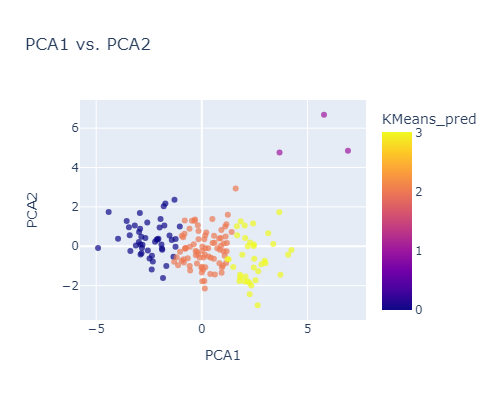

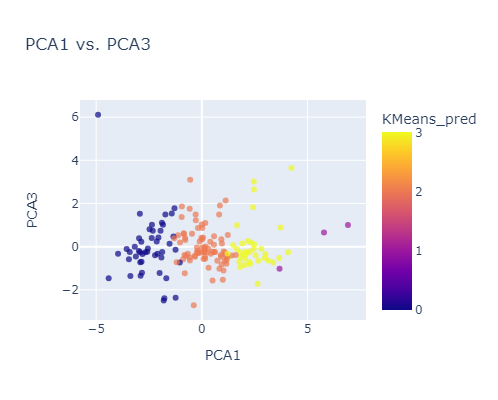

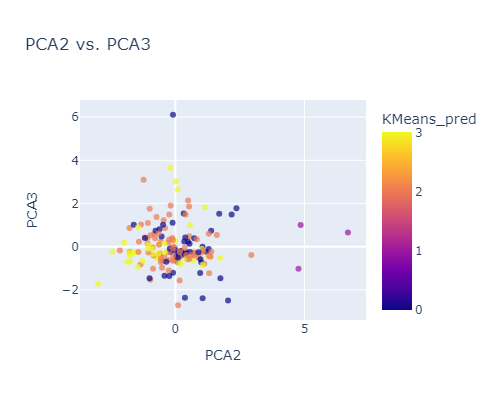

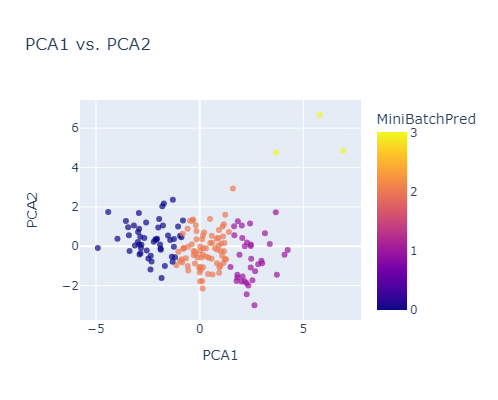

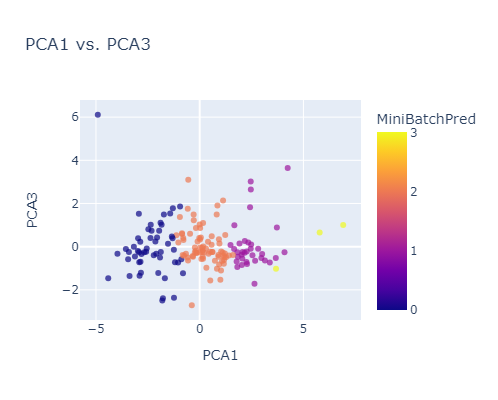

...

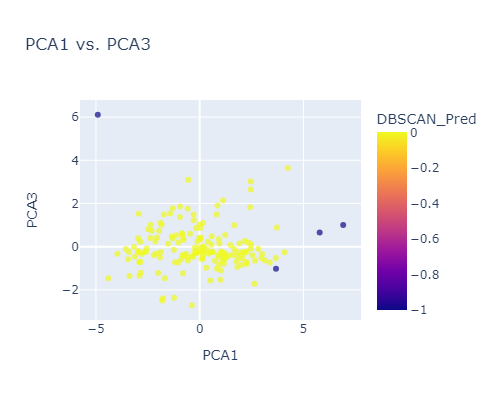

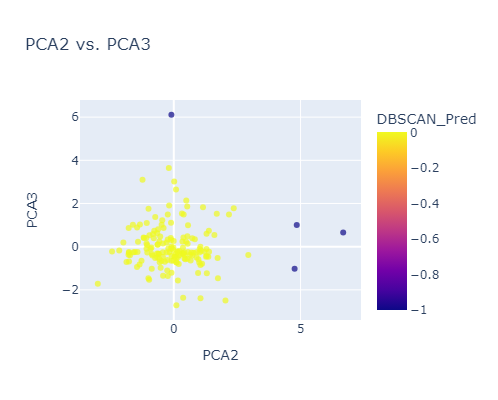

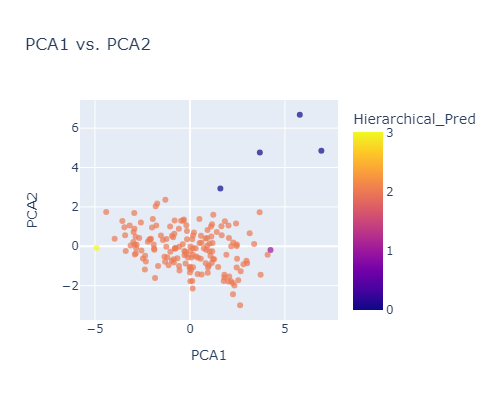

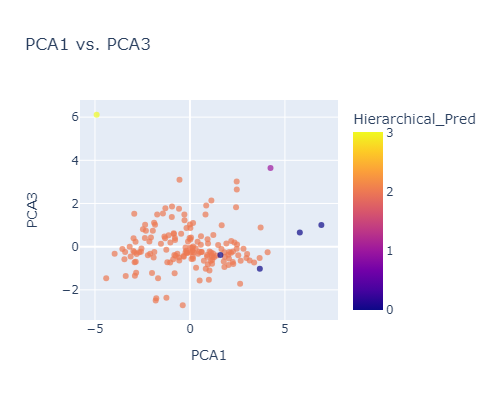

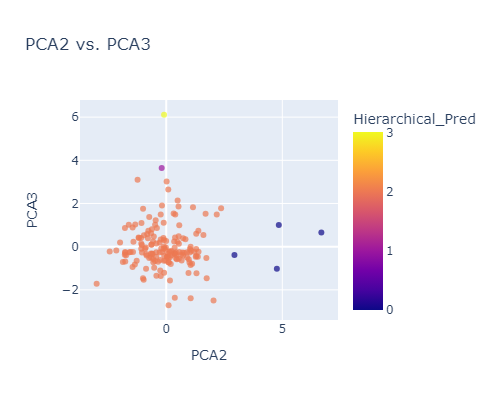

In [213]:

for col in ['KMeans_pred','MiniBatchPred','GMM_pred','DBSCAN_Pred','Hierarchical_Pred']:
    scatterPlot(df_pca_copy, 'PCA1', 'PCA2', 'PCA3', col)


$Interpretations:$ K-Means algorithm demonstrated superior capabiities in acheiving scores.

# With Outliers to check which function has dome well:



In [157]:
df_pca2_copy.columns

Index(['PC1', 'PC2', 'PC3', 'KMeans_pred_outliers', 'MiniBatchPred_outliers',
       'GMM_pred_outliers', 'DBSCAN_Pred_outliers',
       'Hierarchical_Pred_outliers'],
      dtype='object')

In [158]:
info2 =pd.DataFrame({'Model':['KMeans_pred_outliers', 'MiniBatchPred_outliers',
       'GMM_pred_outliers', 'DBSCAN_Pred_outliers',
       'Hierarchical_Pred_outliers'],
                    'silhouette_score':[silhouettescore_km,m_outliers_silhouettescore,silhoutteScore_gmm,silhoutteScore_dbscan,silhoutteScore_h],
                    'calinski_score':[calinskiharabaszscore_km,m_outliers_calinskiharabaszscore,calinskiScore_gmm, calinskiScore_dbscan,calinskiScore_h]
                    ,'davies_bouldin_score':[dunnindex_km,m_outliers_dunnindex,dunnIndex_gmm ,dunnIndex_dbscan,dunnIndex_h]})
info2.style.highlight_max(color="yellow")

,Model,silhouette_score,calinski_score,davies_bouldin_score
0,KMeans_pred_outliers,0.308413,86.635886,1.077666
1,MiniBatchPred_outliers,0.277443,87.147217,1.230142
2,GMM_pred_outliers,0.258384,37.530770,2.077136
3,DBSCAN_Pred_outliers,0.326303,3.698697,2.350597
4,Hierarchical_Pred_outliers,0.174947,2.936986,0.535426


$Result:$ 
* In both the case MiniBatches has predicted well, hence we will be choosing here the MiniBatchesKMeans
    

# Let's choose the final model and analyze it



In [159]:
# lets put the new column name labels in the original dataset data
labels =df_pca_copy['MiniBatchPred']
country_data['Label'] =labels
country_data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,2
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


In [160]:
# total clusters without the outliers n=4
dataL0=country_data[country_data['Label']==0]
dataL1=country_data[country_data['Label']==1]
dataL2=country_data[country_data['Label']==2]
dataL3=country_data[country_data['Label']==3]


In [161]:
# Lets Check each cluster Data
#1 dataL0
dataL0.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,0
17,Benin,111.0,23.8,4.10,37.2,1820,0.885,61.8,5.36,758,0
21,Botswana,52.5,43.6,8.30,51.3,13300,8.920,57.1,2.88,6350,0
25,Burkina Faso,116.0,19.2,6.74,29.6,1430,6.810,57.9,5.87,575,0


In [162]:
dataL1.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Label
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,1
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,1
11,Bahrain,8.6,69.5,4.97,50.9,41100,7.440,76.0,2.16,20700,1
15,Belgium,4.5,76.4,10.70,74.7,41100,1.880,80.0,1.86,44400,1
23,Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300,1


In [163]:
dataL2.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Label
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
5,Argentina,14.5,18.9,8.10,16.0,18700,20.90,75.8,2.37,10300,2
6,Armenia,18.1,20.8,4.40,45.3,6700,7.77,73.3,1.69,3220,2


In [164]:
dataL3.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Label
91,Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000,3
98,Malta,6.8,153.0,8.65,154.0,28300,3.830,80.3,1.36,21100,3
133,Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600,3


In [215]:
country_data['Label'].value_counts()

2    77
0    52
1    35
3     3
Name: Label, dtype: int64

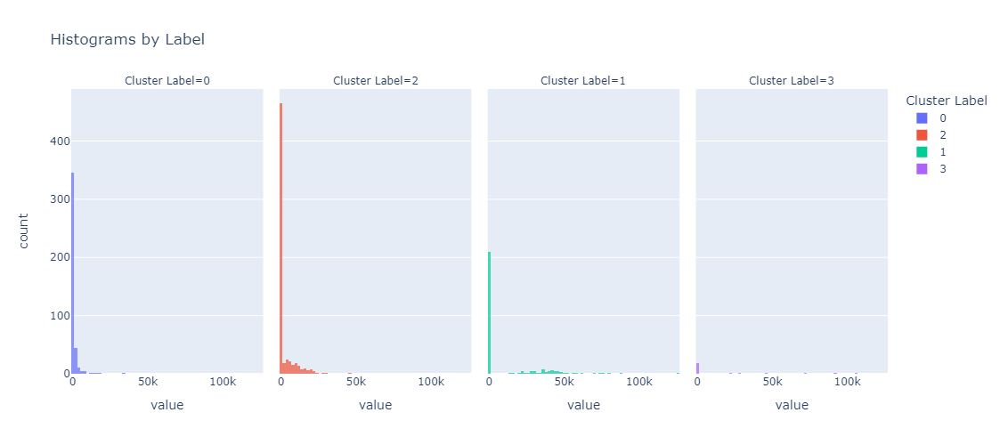

In [219]:
# Create histograms for each column with facets for 'Label'
fig = px.histogram(country_data, x=country_data.columns[2:], color='Label',
                   facet_col='Label', title="Histograms by Label",
                   labels={'Label': 'Cluster Label'}, opacity=0.7)

# Customize the layout
fig.update_layout(width=1000, height=500, showlegend=True)

# Show the plot
fig.show()

$Alternatively:$
import  matplotlib.pyplot as plt
for column in country_data.drop(columns=['country','Label']):
    ax =sns.FacetGrid(country_data,col='Label')
    ax.map(plt.hist,column)

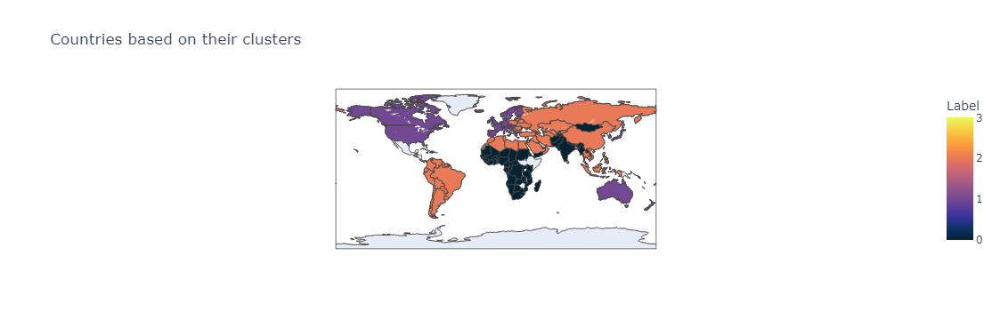

In [222]:
fig= px.choropleth(country_data, locationmode ='country names',
                  locations='country',
                  color='Label',
                  title='Countries based on their clusters',
                  color_continuous_scale='thermal')
fig.show()

$Interpretation $ :Countries with a label equal to zero need more help.

* These regions mainly include African countries.

# Let's see the list of these countries:

In [223]:
dfn = country_data[country_data['Label'] == 0]
dfn.country

0                   Afghanistan
3                        Angola
17                        Benin
21                     Botswana
25                 Burkina Faso
26                      Burundi
28                     Cameroon
31     Central African Republic
32                         Chad
36                      Comoros
37             Congo, Dem. Rep.
38                  Congo, Rep.
40                Cote d'Ivoire
49            Equatorial Guinea
50                      Eritrea
55                        Gabon
56                       Gambia
59                        Ghana
63                       Guinea
64                Guinea-Bissau
66                        Haiti
69                        India
80                        Kenya
81                     Kiribati
84                          Lao
87                      Lesotho
88                      Liberia
93                   Madagascar
94                       Malawi
97                         Mali
99                   Mauritania
103     

In [225]:
dfn['country'].value_counts().index

Index(['Afghanistan', 'Angola', 'Malawi', 'Mali', 'Mauritania', 'Mongolia',
       'Mozambique', 'Myanmar', 'Namibia', 'Nepal', 'Niger', 'Nigeria',
       'Pakistan', 'Rwanda', 'Senegal', 'Sierra Leone', 'Solomon Islands',
       'South Africa', 'Sudan', 'Tajikistan', 'Tanzania', 'Timor-Leste',
       'Togo', 'Uganda', 'Yemen', 'Madagascar', 'Liberia', 'Lesotho',
       'Cote d'Ivoire', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi',
       'Cameroon', 'Central African Republic', 'Chad', 'Comoros',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Equatorial Guinea', 'Lao',
       'Eritrea', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau',
       'Haiti', 'India', 'Kenya', 'Kiribati', 'Zambia'],
      dtype='object')

# Conclusion: 
* Hence African Region Required More Help for child birth rate, income facility, preventing death rate due to starving and surviving.

-Zeba Khan